In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white", context='poster')
import math

In [62]:
import datashader as ds, datashader.transfer_functions as tf
import dask.dataframe as dd

In [2]:
%load_ext autoreload
%autoreload 2


In [72]:
plot_width  = int(900)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)

In [64]:
plot_width  = int(900)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)
#background = "black"
background=None

from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9

export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

In [3]:
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [4]:
corder = ['C1', 'C2', 'C3', 'C4', 'C0']

In [655]:
morder = ['EXOENZYME','OVERFLOW',   'ROS','MIXOTROPH','MIN', ]
media_order = ['lowN', 'pro99']
mpalette = [ '#426b69', '#9b7874', '#b191ff', '#84dcc6', '#d6d4a0',]
#mpalette = sns.color_palette(mpalette)
#morder = [morder[1]] + morder[3:]
#mpalette = [mpalette[1]] + mpalette[3:]
sns.color_palette(mpalette)


[(0.25882352941176473, 0.4196078431372549, 0.4117647058823529),
 (0.6078431372549019, 0.47058823529411764, 0.4549019607843137),
 (0.6941176470588235, 0.5686274509803921, 1.0),
 (0.5176470588235295, 0.8627450980392157, 0.7764705882352941),
 (0.8392156862745098, 0.8313725490196079, 0.6274509803921569)]

In [6]:
gorder = [ 'Strong', 'Sustained', 'Inhibited', 'Weak', 'Axenic',   'Other']
gpalette = sns.color_palette('Set2', n_colors=4).as_hex() + ['black', 'lightgrey']
gpalette = ['#882255', '#CC6677', '#332288', 
             '#44AA99','#88CCEE',
            '#D0CFCA',  ]

sns.color_palette(gpalette)

[(0.5333333333333333, 0.13333333333333333, 0.3333333333333333),
 (0.8, 0.4, 0.4666666666666667),
 (0.2, 0.13333333333333333, 0.5333333333333333),
 (0.26666666666666666, 0.6666666666666666, 0.6),
 (0.5333333333333333, 0.8, 0.9333333333333333),
 (0.8156862745098039, 0.8117647058823529, 0.792156862745098)]

In [7]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [8]:
sns.color_palette('summer')

[(0.1411764705882353, 0.5705882352941176, 0.4),
 (0.28627450980392155, 0.6431372549019607, 0.4),
 (0.42745098039215684, 0.7137254901960784, 0.4),
 (0.5725490196078431, 0.7862745098039216, 0.4),
 (0.7137254901960784, 0.8568627450980393, 0.4),
 (0.8588235294117647, 0.9294117647058824, 0.4)]

In [9]:
sns.palettes.QUAL_PALETTES

['tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'Set1',
 'Set2',
 'Set3',
 'Accent',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Dark2',
 'deep',
 'deep6',
 'muted',
 'muted6',
 'pastel',
 'pastel6',
 'bright',
 'bright6',
 'dark',
 'dark6',
 'colorblind',
 'colorblind6']

In [10]:
ccnorder = ['Bp', 'Np','Bh',  'Nh', 'DIN','DON',  'RDON', ]
ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light,DINCOLOR, DONCOLOR, RDONCOLOR, ]

#Hex Codes: #262842, #293961, #2C497F, #8897BD, #E3E4FA
#Hex Codes: #49593C, #945C39, #DF5F35, #EF9E84, #FFE3D1
#Hex Codes: #5E1525, #C74F29, #E99E46, #B6C38D, #828144
ccnpalette = ['#2F6755', '#98A69A', '#7d5c54', '#E7BB96', '#262842', '#2C497F', '#8897BD']
#ccnpalette = ['#828144', '#B6C38D', '#E99E46', '#E7BB96', '#262842', '#2C497F', '#8897BD']
cccorder = ['Bp[C]', 'Cp','Bh[C]',  'Ch', 'DIC','DOC',  'RDOC', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light,DICCOLOR, DOCCOLOR, RDOCCOLOR, ]
#Hex Codes: #49593C, #945C39, #DF5F35, #EF9E84, #FFE3D1
cccpalette = ['#2F6755', '#98A69A', '#7d5c54', '#E7BB96', '#DF5F35', '#EF9E84', '#ffd8d1']

sns.color_palette(cccpalette)

[(0.1843137254901961, 0.403921568627451, 0.3333333333333333),
 (0.596078431372549, 0.6509803921568628, 0.6039215686274509),
 (0.49019607843137253, 0.3607843137254902, 0.32941176470588235),
 (0.9058823529411765, 0.7333333333333333, 0.5882352941176471),
 (0.8745098039215686, 0.37254901960784315, 0.20784313725490197),
 (0.9372549019607843, 0.6196078431372549, 0.5176470588235295),
 (1.0, 0.8470588235294118, 0.8196078431372549)]

In [11]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [12]:
refdf = pd.read_excel('ML_model/reference_final.xlsx')

In [13]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = 'results'

In [14]:
os.listdir('ML_model')

['reference_yara_axenic.xlsx',
 '10CC_ML_classifier.joblib',
 '10CC model estimate.ipynb',
 '__pycache__',
 'model_store_compare_RMSE_model.ipynb',
 '10CC_reference_to_model_test_train.ipynb',
 'model_store_compare_RMSE_OVERFLOW_fix.ipynb',
 'monte_add_ponly_predicted_classes.csv.gz',
 'features_monte_add_ponly_clean.csv.gz',
 '.ipynb_checkpoints',
 'monte_ponly_predicted_classes.csv.gz',
 'reference_10cc_axenic.xlsx',
 'features_monte_ponly_clean.csv.gz',
 'monte_ponly_add_OVERFLOW_predicted_classes.csv.gz',
 'reference_10cc_all.xlsx',
 '10CC_reference_to_model.ipynb',
 'monte_het_predicted_classes.csv.gz',
 'features_monte_OVERFLOW_fix.csv.gz',
 'reference_final.xlsx',
 'monte_predicted_classes.csv.gz',
 'features_monte_het_clean.csv.gz',
 'features_monte_ponly_add_OVERFLOW.csv.gz',
 'reference_pro99_axenic.xlsx',
 'monte_add_het_predicted_classes.csv.gz',
 '10cc_FL_to_cell_numbers.ipynb',
 '10CC_reference_to_model_per_strain_shuffle.ipynb',
 'reference_ccpa.xlsx',
 'reference_10cc.x

In [15]:
os.listdir(dpath)

['monte_add_ROS_round2_sum.csv.gz',
 'monte_add_OVERFLOW_df.csv.gz',
 'monte_ponly_add_OVERFLOW_clean_df.csv.gz',
 'monte_ponly_clean_mse.csv.gz',
 'monte2_ponly_sum.csv.gz',
 'sensitivity_vmax2_df.csv.gz',
 'monte_ponly_clean_df.csv.gz',
 'monte_ponly_fix_OVERFLOW_df.csv.gz',
 'monte_het_minmse.csv.gz',
 'sensitivity_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_sum.csv.gz',
 'monte_add_ROS_round2_mse.csv.gz',
 'monte_add_het_mse.csv.gz',
 'monte_ponly_add_OVERFLOW_df.csv.gz',
 'monte_ponly_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_mse.csv.gz',
 'monte_ponly_fix_OVERFLOW_clean_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_df.csv.gz',
 'baseline_df.csv.gz',
 'results_old_26122023',
 'monte_het_clean_sum.csv.gz',
 'baseline_sum.csv.gz',
 'monte2_add_het_mse.csv.gz',
 'monte_strong_ponly_clean_df.csv.gz',
 'sensitivity_vmax2_sum.csv.gz',
 'monte_fix_OVERFLOW_mse.csv.gz',
 'monte_strong_ponly_sum.csv.gz',
 'monte_add_het_df.c

In [252]:
dpath = 'results'
sim_df1 = pd.read_csv(os.path.join(dpath,'monte_het_clean_df.csv.gz',))
sim_df2 = pd.read_csv(os.path.join(dpath,'monte_add_het_clean_df.csv.gz',))


# sim_df = pd.concat([
#     sim_df1,
#     sim_df2,
# ])

In [683]:
minmse_df1 = pd.read_csv('ML_model/monte_add_het_predicted_classes.csv.gz',)
minmse_df2 = pd.read_csv('ML_model/monte_het_predicted_classes.csv.gz',)



In [684]:
problematic_runids = pd.read_csv('ML_model/problematic_runids_het.txt', names=['run_id'])
problematic_runids_add = pd.read_csv('ML_model/problematic_runids_add_het.txt', names=['run_id'])

In [691]:
minmse_df1 = minmse_df1.loc[~minmse_df1.run_id.isin(problematic_runids_add.run_id)] 
minmse_df2 = minmse_df2.loc[~minmse_df2.run_id.isin(problematic_runids.run_id)] 


In [692]:
minmse_df1['C2N_Het'] = 'ok'
minmse_df1.loc[minmse_df1.run_id.isin(problematic_runids_add.run_id), 'C2N_Het'] = 'C2N_too_low'

In [693]:
minmse_df2['C2N_Het'] = 'ok'
minmse_df2.loc[minmse_df2.run_id.isin(problematic_runids.run_id), 'C2N_Het'] = 'C2N_too_low'

In [694]:
sim_df = pd.concat([sim_df1, sim_df2, ], ignore_index=True)
minmse_df = pd.concat([minmse_df1, minmse_df2, ], ignore_index=True)

In [695]:
minmse_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,Unnamed: 0,Sample,full name,Group,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled,C2N_Het,VPRO_cluster
0,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,10C0,Marinovum 5F3,Weak,5.205234,45.551143,74.0,237.104339,237.104339,ok,NaN
1,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Other,0.528581,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,ok,NaN
2,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Axenic,0.624934,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_94,701930.0,1C0,Axenic,Axenic,4.316923,19.416927,74.0,83.821385,83.821385,ok,NaN
3,monteadd2_EXOENZYME_13_monte_vpro_13_69_EXOENZ...,Weak,0.667942,monteadd2_EXOENZYME_13_monte_vpro_13_69_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1_58,761397.0,10A0,Marinovum 5F3,Weak,2.747116,23.425443,74.0,64.352420,64.352420,ok,NaN
4,monteadd2_EXOENZYME_13_monte_vpro_13_69_EXOENZ...,Weak,0.989825,monteadd2_EXOENZYME_13_monte_vpro_13_69_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1_94,739403.0,10C0,Marinovum 5F3,Weak,1.861981,20.436034,74.0,38.051514,38.051514,ok,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37262,monte_ROS_9_monte_vpro_90_89_ROS_C0_88_lowN_al...,Other,0.960867,monte_ROS_9_monte_vpro_90_89_ROS_C0_88,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,ok,C0
37263,monte_ROS_9_monte_vpro_90_89_ROS_C0_94_lowN_al...,Other,0.669145,monte_ROS_9_monte_vpro_90_89_ROS_C0_94,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,ok,C0
37264,monte_ROS_9_monte_vpro_90_89_ROS_C0_9_lowN_all...,Other,0.586460,monte_ROS_9_monte_vpro_90_89_ROS_C0_9,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,ok,C0
37265,monte_ROS_9_monte_vpro_93_82_ROS_C1_55_lowN_al...,Weak,0.988714,monte_ROS_9_monte_vpro_93_82_ROS_C1_55,lowN,all,ROS,h-8660846992299669535,vpro_93_82_ROS_C1,1254828.0,11A0,Roseovarius 5C3,Weak,3.926298,32.505641,74.0,127.626821,127.626821,ok,C1


In [696]:
sim_df.columns

Index(['Unnamed: 0', 'Bp', 'Np', 'Cp', 'Bh', 'Nh', 'Ch', 'DON', 'RDON', 'DIN',
       'DOC', 'RDOC', 'DIC', 'ROS', 't', 'day', 'gross_uptakeINp',
       'gross_uptakeINh', 'gross_uptakeONp', 'gross_uptakeONh',
       'gross_uptakeICp', 'gross_uptakeICh', 'gross_uptakeOCp',
       'gross_uptakeOCh', 'uptakeNp', 'uptakeNh', 'uptakeCp', 'uptakeCh',
       'QCp', 'QCh', 'biosynthesisNp', 'biosynthesisNh', 'respirationCp',
       'respirationCh', 'biomass_breakdownCp', 'biomass_breakdownCh',
       'overflowNp', 'overflowNh', 'overflowCp', 'overflowCh', 'Bp[C]',
       'Bptotal[N]', 'Bptotal[C]', 'Bh[C]', 'Bhtotal[N]', 'Bhtotal[C]',
       'run_id', 'ROSproductionp', 'ROSproductionh', 'ROSlossp', 'ROSlossh',
       'deathbiomassNp', 'deathbiomassNh', 'deathstoreNp', 'deathstoreNh',
       'deathstoreCp', 'deathstoreCh', 'DON2DIN_exop', 'DON2DIN_exoh',
       'DON2DIN', 'additionalLossRatep', 'additionalLossRateh', 'regNp',
       'regNh', 'regCp', 'regCh', 'deathC_DOCp', 'deathC_DOCh', 'dea

In [697]:
minmse_df.C2N_Het.value_counts()

C2N_Het
ok    37267
Name: count, dtype: int64

In [698]:
df = pd.merge(minmse_df, 
                  sim_df[['run_id', 'day', 'Bptotal[N]','Bptotal[C]','Bhtotal[N]','Bhtotal[C]', 'DON', 'DIN', 'RDON', 'RDOC', 'DOC', 'QCh', 'QCp']], 
                  on='run_id', how='left')

In [699]:
df.columns

Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
       'hash', 'VPRO', 'Unnamed: 0', 'Sample', 'full name', 'Group',
       'RMSE_Bptotal[N]', 'RMSE_Bptotal[C]', 'compare_points', 'RMSE',
       'RMSE_filled', 'C2N_Het', 'VPRO_cluster', 'day', 'Bptotal[N]',
       'Bptotal[C]', 'Bhtotal[N]', 'Bhtotal[C]', 'DON', 'DIN', 'RDON', 'RDOC',
       'DOC', 'QCh', 'QCp'],
      dtype='object')

In [700]:
df = df.reset_index(drop=True)

In [701]:
runids = minmse_df.loc[minmse_df.C2N_Het.isin(['ok'])].groupby(['model', 'y_pred'])['run_id'].sample(50, replace=True)

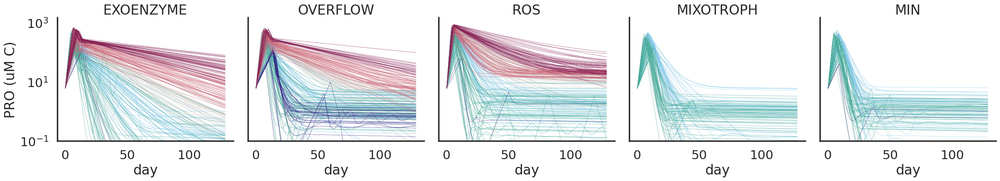

In [702]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='Bptotal[C]',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='PRO (uM C)')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
#g.set(ylim=(0, 1000))

g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

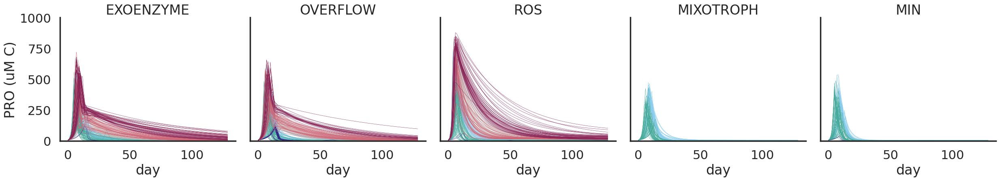

In [703]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='Bptotal[C]',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='PRO (uM C)')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
g.set(ylim=(0, 1000))

#g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

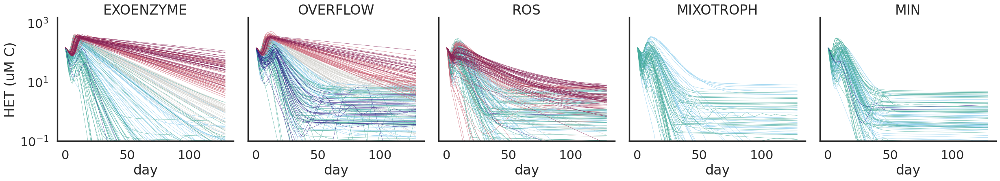

In [538]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='Bhtotal[C]',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='HET (uM C)')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
#g.set(ylim=(0, 1000))

g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

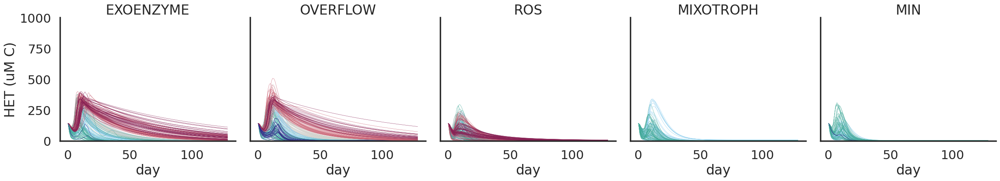

In [539]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='Bhtotal[C]',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='HET (uM C)')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
g.set(ylim=(0, 1000))

#g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

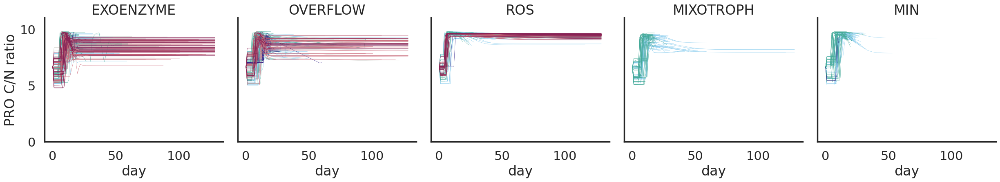

In [550]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids) & df['Bptotal[C]'].ge(5)],
    x='day',
    y='QCp',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='PRO C/N ratio')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
g.set(ylim=(0, 11))

#g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

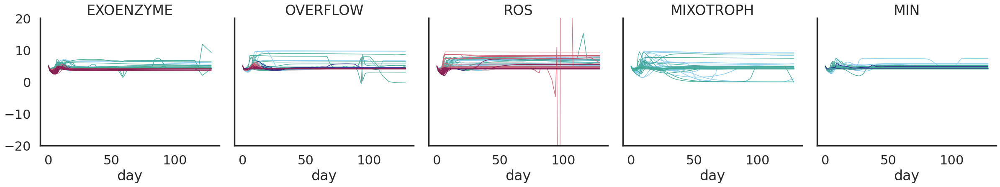

In [543]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='QCh',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=1,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
#g.set(ylabel='umol C/L')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
g.set(ylim=(-20, 20))

#g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

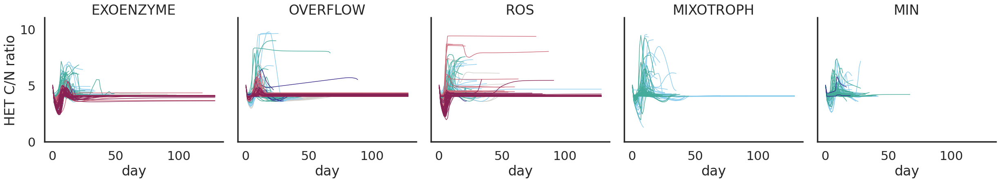

In [551]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids) & df['Bhtotal[C]'].ge(5) #& #df['QCh'].le(3.5)& 
    #df['day'].ge(10)
    ],
    #data=df.loc[df.run_id.isin(runids) & df['Bhtotal[C]'].ge(5)],
    x='day',
    y='QCh',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=1,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='umol C/L')
g.set(ylabel='HET C/N ratio')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
g.set(ylim=(0, 11))

#g.set(yscale='log', ylim=(1e-1, 1500))
plt.show()

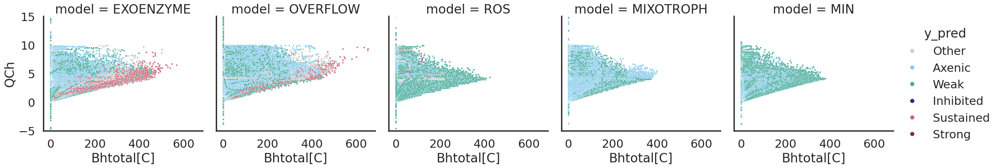

In [462]:
sns.relplot(
    data=df,
    x='Bhtotal[C]', y='QCh',
    hue='y_pred', hue_order=reversed(gorder),
     palette=reversed(gpalette), s=10,
    col='model', col_order=morder, #col_wrap=3,
).set(ylim=(-5,15), )

In [482]:
df.loc[df['Bhtotal[C]'].ge(5) & df['QCh'].le(3)& df['day'].ge(50)].day.describe()

count    117157.000000
mean         79.696248
std          20.226176
min          51.784028
25%          62.892361
50%          76.939583
75%          93.787500
max         128.767361
Name: day, dtype: float64

In [498]:
df.loc[df['Bhtotal[C]'].ge(10) & df['QCh'].le(2)& df['day'].ge(10)].groupby(['model', 'y_pred']).run_id.nunique(
    
).reset_index().pivot(index='model', columns='y_pred').fillna(0)

run_id                                          
y_pred     Axenic Inhibited  Other Strong Sustained    Weak
model                                                      
EXOENZYME  2117.0       0.0  153.0    4.0     538.0  1807.0
MIN        2099.0       0.0    0.0    0.0       0.0  4460.0
MIXOTROPH  2184.0       0.0    0.0    0.0       0.0  3865.0
OVERFLOW   1769.0      22.0   15.0    0.0     103.0  1888.0
ROS         874.0      12.0  669.0  506.0      21.0  7624.0

In [495]:
df.groupby(['model', 'y_pred']).run_id.nunique(
    
).reset_index().pivot(index='model', columns='y_pred').fillna(0)

run_id                                             
y_pred      Axenic Inhibited   Other  Strong Sustained     Weak
model                                                          
EXOENZYME   9263.0       3.0  1939.0   126.0    3760.0   4650.0
MIN         3291.0       2.0     0.0     0.0       0.0   6571.0
MIXOTROPH   4290.0       0.0     0.0     0.0       0.0   5569.0
OVERFLOW   14683.0      89.0  1020.0    25.0     590.0  11192.0
ROS         2054.0      17.0  3600.0  3097.0     155.0  10829.0

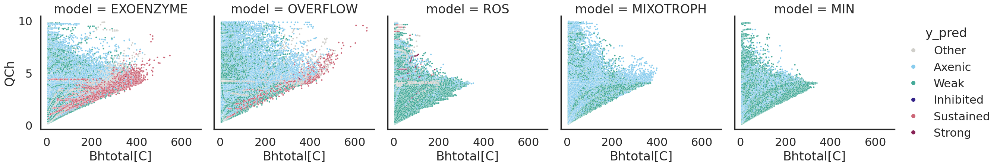

In [499]:
sns.relplot(
    data=df.loc[df['Bhtotal[C]'].ge(5) & 
        #df['QCh'].le(4)& 
        df['day'].ge(10)],
    x='Bhtotal[C]', y='QCh',
    hue='y_pred', hue_order=reversed(gorder),
     palette=reversed(gpalette), s=10,
    col='model', col_order=morder, #col_wrap=3,
)#.set(ylim=(-5,5), )

In [559]:
refdf.groupby(['Group','Sample']).size()

Group      Sample  
Axenic     1A0         74
           1B0         74
           1C0         74
Inhibited  3A0         74
           3B0         74
           3C0         74
           4A0         74
           4B0         74
           4C0         74
Strong     5A0         74
           5B0         74
           5C0         74
           5x5_11A0    74
           5x5_11B0    74
           5x5_11C0    74
           5x5_16A0    74
           5x5_16B0    74
           5x5_16C0    74
           5x5_1A0     74
           5x5_1B0     74
           5x5_1C0     74
           5x5_21A0    74
           5x5_21B0    74
           5x5_21C0    74
           5x5_6A0     74
           5x5_6B0     74
           5x5_6C0     74
Sustained  6A0         74
           6B0         74
           6C0         74
           7A0         74
           7B0         74
           7C0         74
Weak       10A0        74
           10B0        74
           10C0        74
           11A0        74
           11B0   

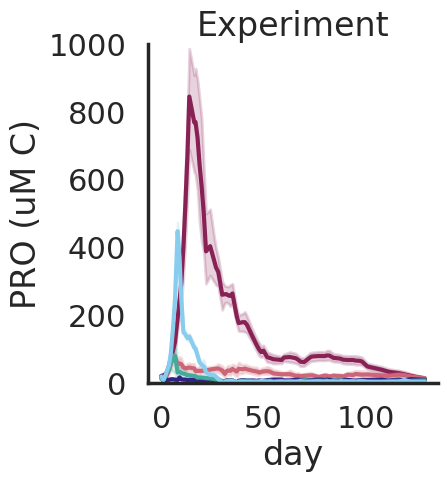

In [560]:
g = sns.relplot(
    data=refdf,
    x='day',
    y='ref_Bp[C]_clip',
    hue='Group', hue_order=gorder,
    kind='line', #lw=0.4,
    #estimator=None, units='Sample', 
    palette=gpalette,
    #col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='PRO (uM C)')
plt.title('Experiment')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
#g.set(yscale='log', ylim=(1e-1, 1500))

g.set(ylim=(0, 1000))
plt.show()

In [562]:
minmse_df_good = minmse_df.loc[minmse_df.C2N_Het.isin(['ok'])].reset_index().copy()
bestids =  minmse_df_good.loc[minmse_df_good.groupby(['model', 'y_pred']).RMSE_filled.idxmin()]


In [563]:
bestdf = pd.merge(bestids, 
                  sim_df[['run_id', 'Bptotal[N]','Bptotal[C]','Bhtotal[N]','Bhtotal[C]','day']], 
                  on='run_id', how='left')

In [564]:
mbestdf = bestdf.melt(
    id_vars = ['run_id', 'y_pred',  'model','Sample', 'day'],
    value_vars = ['Bptotal[C]',  'Bhtotal[C]'],
    #var_name = 'Strain',
    value_name = 'uM C',
)

In [565]:
mbestdf['Strain'] = mbestdf['variable'].map({'Bhtotal[C]': 'HET', 'Bptotal[C]':'PRO'})

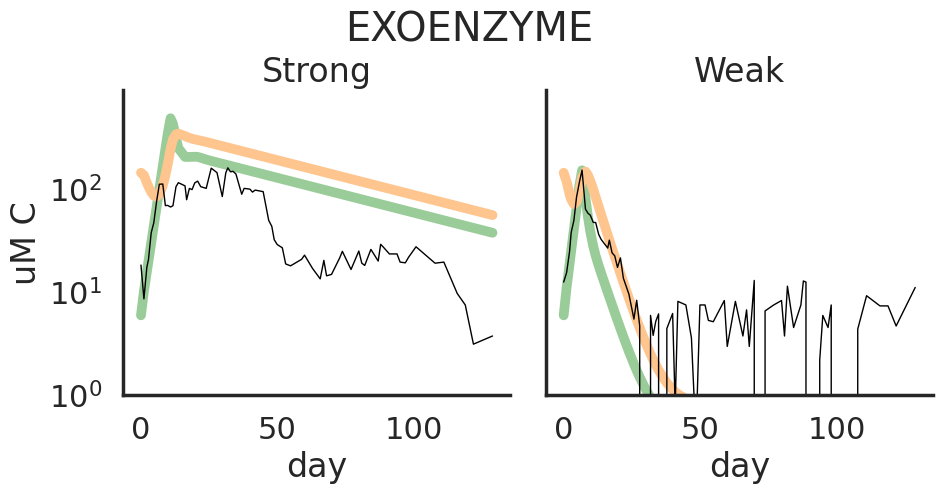

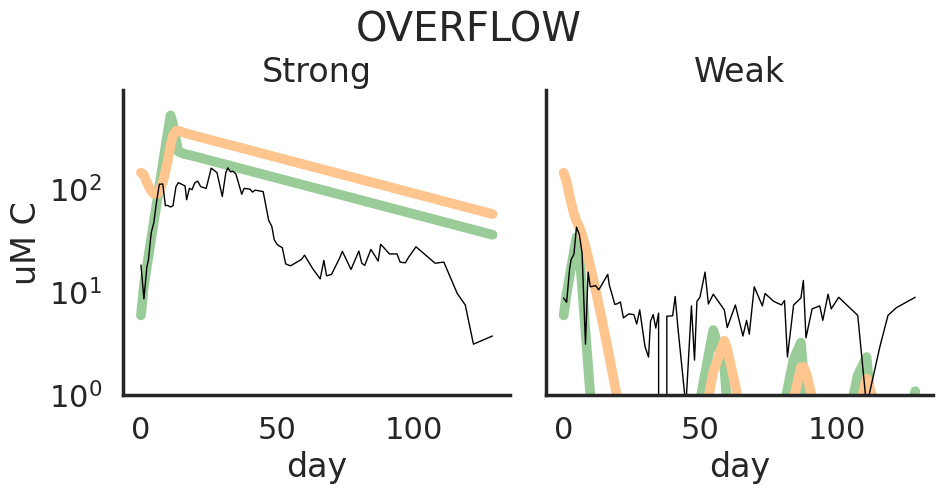

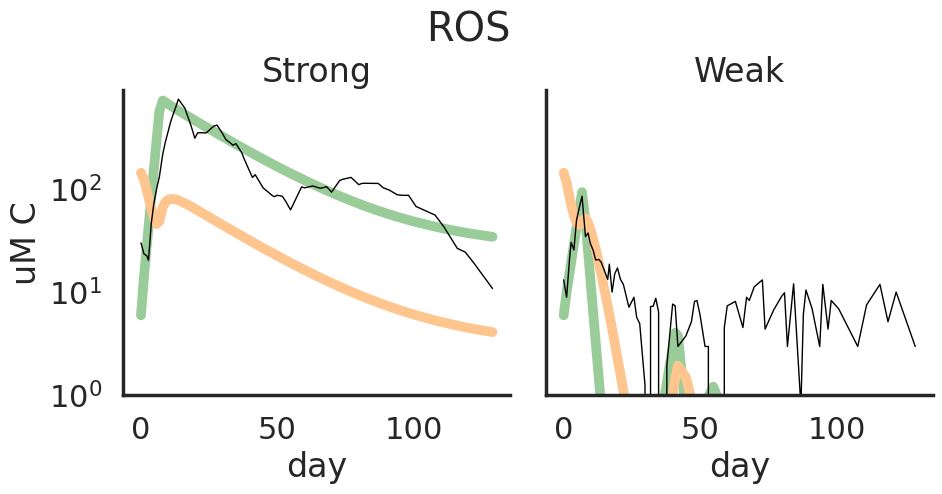

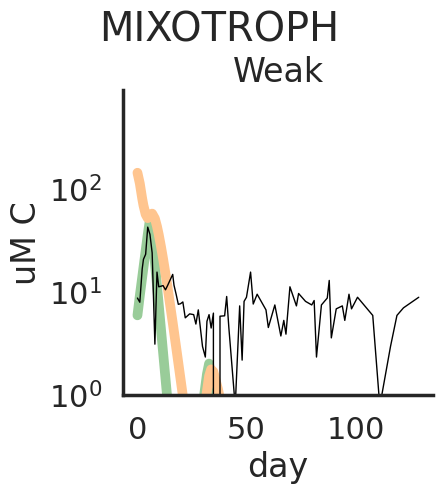

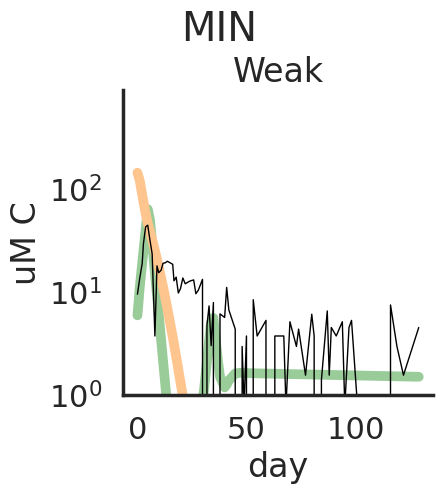

In [566]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
for m in morder:
    g = sns.relplot(
        data=mbestdf.loc[mbestdf.model.isin([m]) & mbestdf.y_pred.isin(['Strong', 'Weak'])],
        x='day',
        y='uM C',
        hue='Strain', hue_order=['PRO', 'HET'], palette=[PCOLOR, HCOLOR],
        kind='line', lw=7,
        col='y_pred', #col_order=gorder, 
        legend=False,
            #aspect=1, height=3,
        #facet_kws=dict(margin_titles=True)
    
    ).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
    for col_val, ax in g.axes_dict.items():        
        data=mbestdf.loc[
            mbestdf.y_pred.isin([col_val]) &
            mbestdf.model.isin([m]) 
        ]
        ref_samples = set(data['Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )

    g.set(ylabel='uM C', ylim=(0,900))
    plt.suptitle(m, y=1.02)
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
    
    g.set(yscale='log', ylim=(1, 900))
    plt.show()

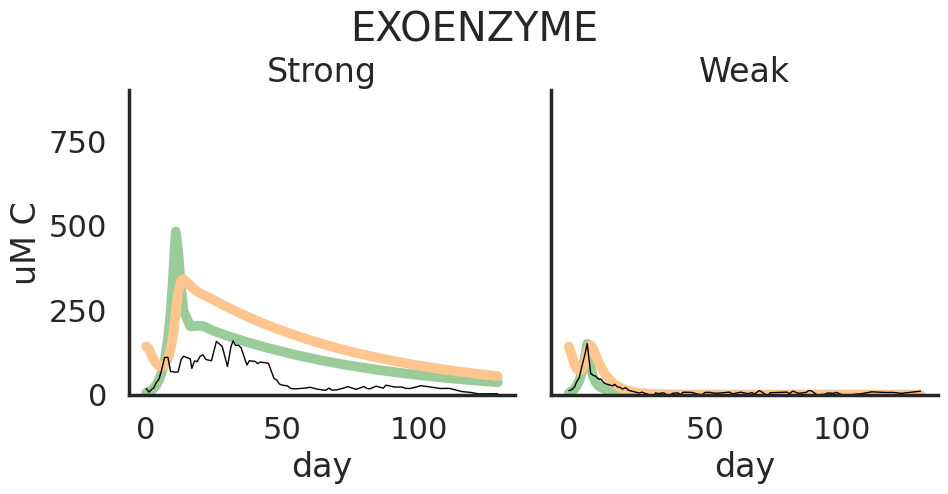

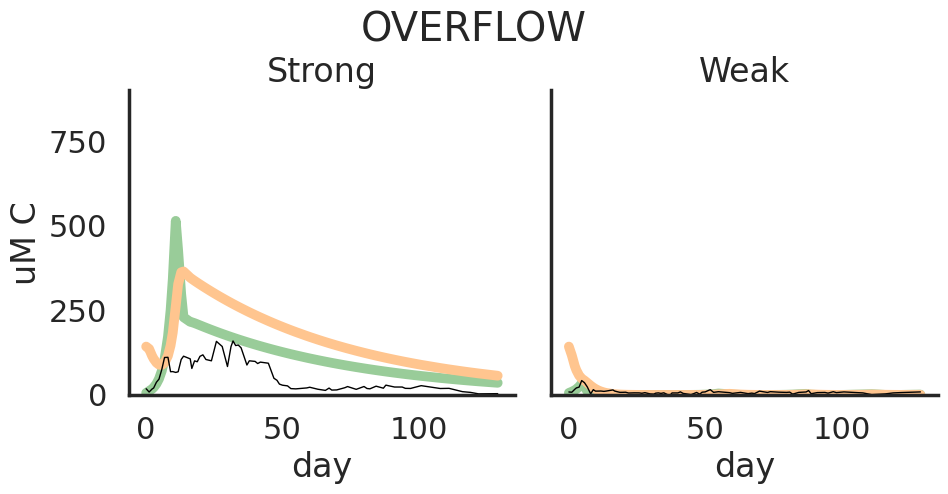

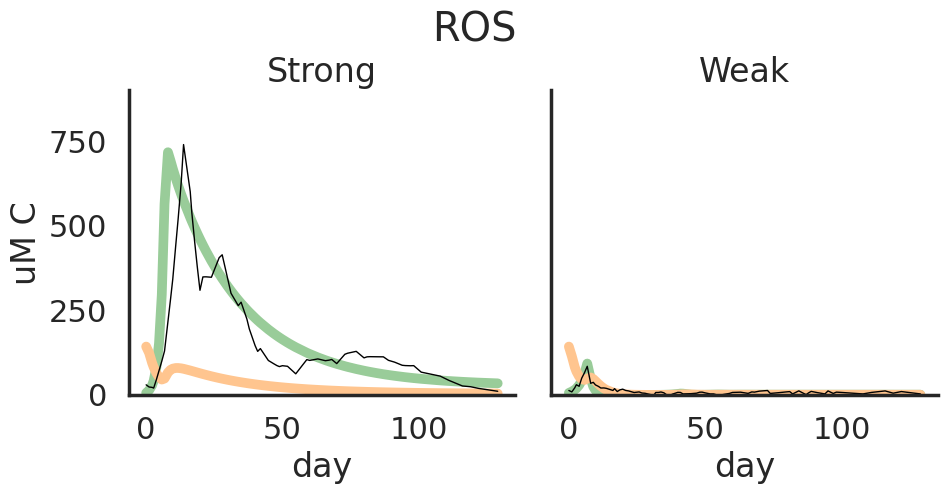

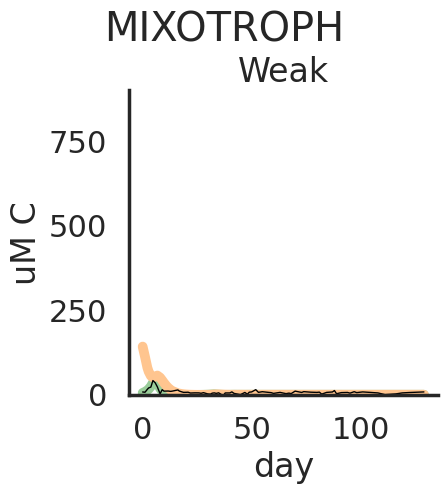

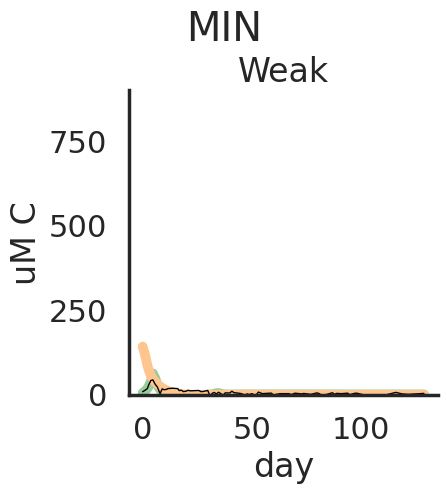

In [567]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
for m in morder:
    g = sns.relplot(
        data=mbestdf.loc[mbestdf.model.isin([m]) & mbestdf.y_pred.isin(['Strong', 'Weak'])],
        x='day',
        y='uM C',
        hue='Strain', hue_order=['PRO', 'HET'], palette=[PCOLOR, HCOLOR],
        kind='line', lw=7,
        col='y_pred', #col_order=gorder, 
        legend=False,
            #aspect=1, height=3,
        #facet_kws=dict(margin_titles=True)
    
    ).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
    for col_val, ax in g.axes_dict.items():        
        data=mbestdf.loc[
            mbestdf.y_pred.isin([col_val]) &
            mbestdf.model.isin([m]) 
        ]
        ref_samples = set(data['Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )

    g.set(ylabel='uM C', ylim=(0,900))
    plt.suptitle(m, y=1.02)
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
    
    #g.set(yscale='log', ylim=(1, 900))
    plt.show()

In [568]:
runids.nunique()

918

In [569]:
sample_df = df.loc[df.run_id.isin(runids)]
#sample_df = sample_df.merge(df_predicted_classes, on=['run_id', 'model'], how='left')
sample_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,Unnamed: 0,...,Bptotal[C],Bhtotal[N],Bhtotal[C],DON,DIN,RDON,RDOC,DOC,QCh,QCp
9102,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,Strong,0.460543,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_23_76_EXOENZYME_C2_73,753963.0,...,5.915179,28.571429,142.857143,3.000000,100.000000,0.000000,0.000000,19.875000,5.000000,6.625000
9103,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,Strong,0.460543,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_23_76_EXOENZYME_C2_73,753963.0,...,9.535337,33.034791,132.753802,0.289473,96.353580,0.791856,3.595613,0.001676,4.018606,4.780612
9104,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,Strong,0.460543,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_23_76_EXOENZYME_C2_73,753963.0,...,15.448107,29.655747,109.359188,0.573414,97.389383,1.611485,6.881078,0.001925,3.687622,4.776402
9105,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,Strong,0.460543,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_23_76_EXOENZYME_C2_73,753963.0,...,20.024065,27.977261,99.310944,0.639981,97.597991,2.056746,8.618527,0.002147,3.549702,4.776384
9106,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,Strong,0.460543,monteadd2_EXOENZYME_14_monte_vpro_23_76_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_23_76_EXOENZYME_C2_73,753963.0,...,31.353248,25.297299,85.924860,0.792817,96.945943,2.864002,11.770996,0.002753,3.396602,4.776382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6424305,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,1209667.0,...,0.892505,0.277243,1.170175,62.243259,0.006506,69.833945,336.738640,0.001479,4.220759,8.637120
6424306,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,1209667.0,...,0.888576,0.275975,1.164830,61.955162,0.006504,70.123769,338.217260,0.001479,4.220786,8.637313
6424307,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,1209667.0,...,0.886224,0.275216,1.161632,61.782831,0.006503,70.297133,339.101730,0.001479,4.220802,8.637429
6424308,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,1209667.0,...,0.883842,0.274448,1.158394,61.608302,0.006501,70.472709,339.997489,0.001479,4.220819,8.637547


In [570]:
sample_df.run_id.nunique(), runids.nunique()

(918, 918)

In [571]:
refdf['ref_Bp[N]_clip'] = refdf['ref_Bp[N]'].clip(lower=0.5)
refdf['ref_Bp[C]_clip'] = refdf['ref_Bp[C]'].clip(lower=0.5)


In [572]:
sample_df.run_id.nunique(), runids.nunique()

(918, 918)

In [573]:
greenpalette = sns.light_palette(PCOLOR, n_colors=12 )[2:]
orangepalette = sns.light_palette(HCOLOR, n_colors=12 )[2:]


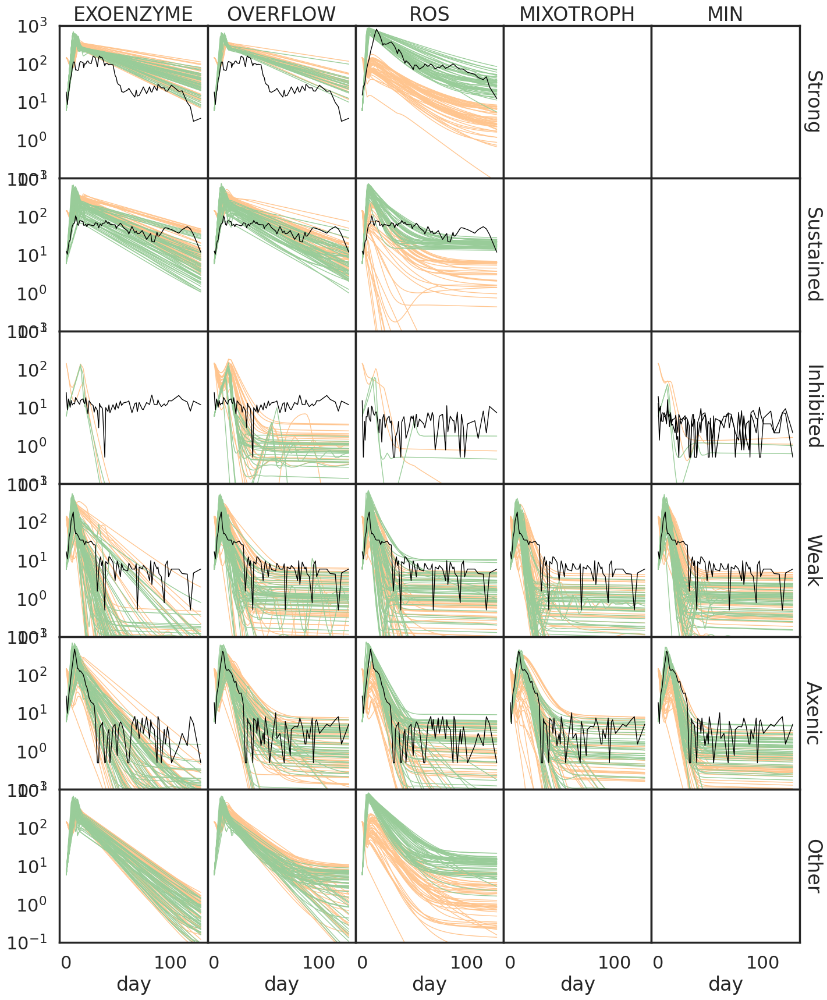

In [574]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        #hue='max_prob',palette='Greens',
        color=PCOLOR,
        x='day', y=f'Bptotal[C]', lw=1, #alpha=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True, despine=False),
        legend=False,
        hue_norm=(0.5,1.3),
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df.loc[
            sample_df.y_pred.isin([row_val]) &
            sample_df.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                #hue='max_prob', palette='Oranges',
                color=HCOLOR,
                x='day', y=f'Bhtotal[C]', lw=1,
                #alpha=0.5,
                legend=False,
                hue_norm=(0.5,1.3),
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]_clip', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log', ylim=(1e-1, 1000))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [575]:
plt.show()

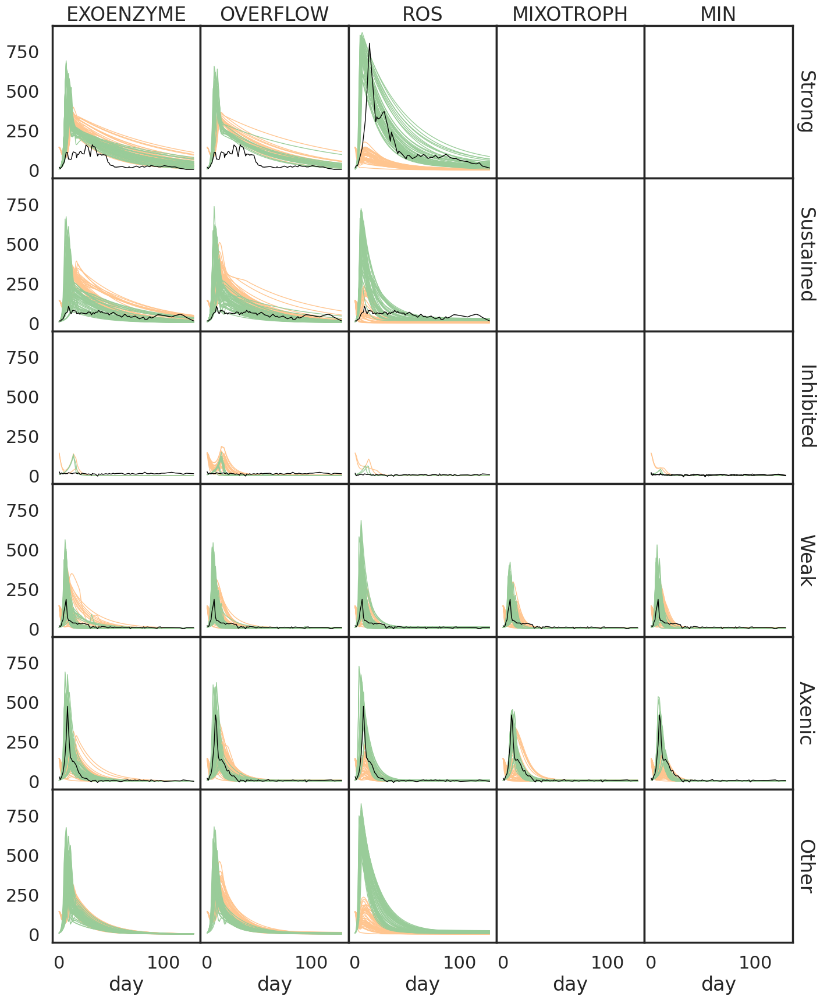

In [576]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        #hue='max_prob', palette='Greens',
        color=PCOLOR,
        x='day', y=f'Bptotal[C]', lw=1, #alpha=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True, despine=False),
        legend=False,
        hue_norm=(0.5,1.3),
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df.loc[
            sample_df.y_pred.isin([row_val]) &
            sample_df.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                #hue='max_prob', palette='Oranges',
                color=HCOLOR,
                
                x='day', y=f'Bhtotal[C]', lw=1,
                #alpha=0.5,
                legend=False,
                hue_norm=(0.5,1.3),
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )
            
    #g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

In [577]:
minmse_df.loc[minmse_df.y_pred == minmse_df.Group].pivot_table(index='model', columns='y_pred', values='RMSE', aggfunc=['count','mean', 'std'])

count                                             mean  \
y_pred      Axenic Inhibited  Strong Sustained     Weak      Axenic   
model                                                                 
EXOENZYME   9263.0       3.0   126.0    3760.0   4650.0  351.138922   
MIN         3291.0       2.0     NaN       NaN   6571.0  315.478505   
MIXOTROPH   4290.0       NaN     NaN       NaN   5569.0  290.788311   
OVERFLOW   14683.0      89.0    25.0     590.0  11192.0  304.923039   
ROS         2054.0      17.0  3097.0     155.0  10829.0  298.722616   

                                                                    std  \
y_pred      Inhibited       Strong    Sustained        Weak      Axenic   
model                                                                     
EXOENZYME   57.448546  1728.743484   804.972675  227.312587  217.916767   
MIN          2.176163          NaN          NaN  186.210131  199.005309   
MIXOTROPH         NaN          NaN          NaN  135.778545  227.534513   
OVERFLOW    42.201138  1724.224049   868.252143  191.985765  217.994831   
ROS        112.266460  3525.462752  1963.030248  247.125802  254.286787   

                                                           
y_pred      Inhibited      Strong   Sustained        Weak  
model                                                      
EXOENZYME    4.263596  273.223957  525.499006  181.934593  
MIN          1.049390         NaN         NaN  137.540155  
MIXOTROPH         NaN         NaN         NaN   92.947151  
OVERFLOW    11.114050  359.104301  438.764294  177.124555  
ROS        116.108278  589.103272  876.634884  283.743855

In [578]:
runids2 =minmse_df_good.loc[minmse_df_good.reset_index().groupby(['model', 'y_pred'])['max_prob'].idxmax(), 'run_id']

#runids2 = minmse_df.groupby(['model',  'y_pred', ])['run_id'].sample(1, replace=True)
sample_df2 = df.loc[df.run_id.isin(runids2)]


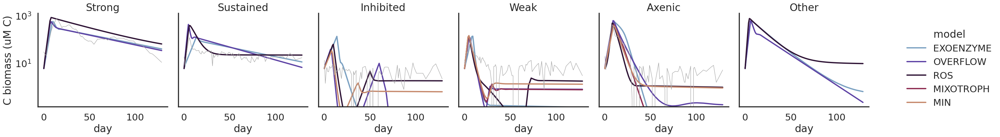

In [579]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='model', palette=mpalette, hue_order=morder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[C]', #lw=1, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        #legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]', lw=1,
                legend=False,
                color='darkgrey',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log') #ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

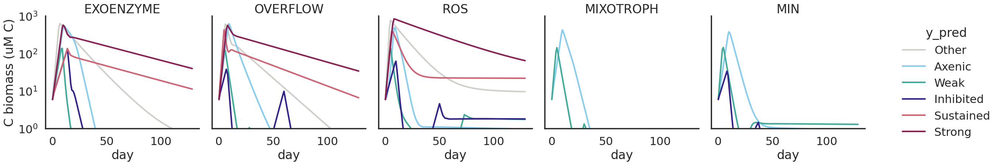

In [580]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=reversed(gpalette), hue_order=reversed(gorder),
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[C]', #lw=1, #alpha=0.5,
        col='model',  col_order=morder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        #legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        # ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        # if ref_samples:
        #     sns.lineplot(
        #         data=refdf.loc[refdf.Sample.isin(ref_samples)],
        #         estimator=None, units='Sample',
        #         x='day', y=f'ref_Bp[C]', lw=1,
        #         legend=False,
        #         color='darkgrey',
        #         #zorder=-1,
        #         ax=ax,
        #     )
            
    g.set(yscale='log') #ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    g.set(ylim=(1, 1e3))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

In [581]:
sample_df2.loc[sample_df2.groupby(['y_pred']).max_prob.idxmax()].Sample


2840120         1A0
1471712         4C0
2666738         NaN
2624706    5x5_21A0
2879488         7A0
5786578        10A0
Name: Sample, dtype: object

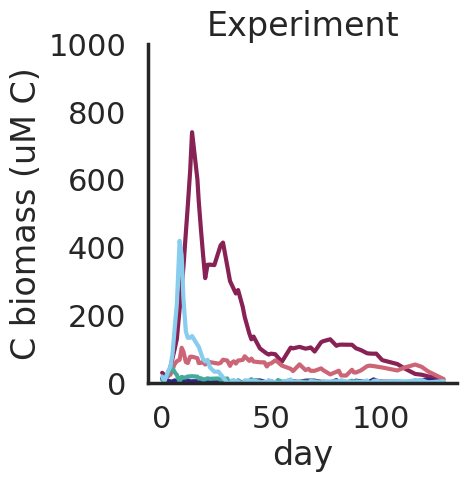

In [584]:
    ref_samples = sample_df2.loc[sample_df2.groupby(['y_pred']).max_prob.idxmax()].Sample

    g = sns.relplot(
        data=refdf.loc[refdf.Sample.isin(ref_samples)],
        kind='line', 
        estimator=None, units='Sample',
        x='day', y=f'ref_Bp[C]', 
        hue='Group', palette=gpalette, hue_order=gorder,
        legend=False,
        #height=3, aspect=1,
    )
            
    #g.set(yscale='log') #ylim=(1e-1, 150))
    g.set(ylim=(0, 1e3))
            
    g.set(ylabel='C biomass (uM C)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.title('Experiment')
    plt.show()

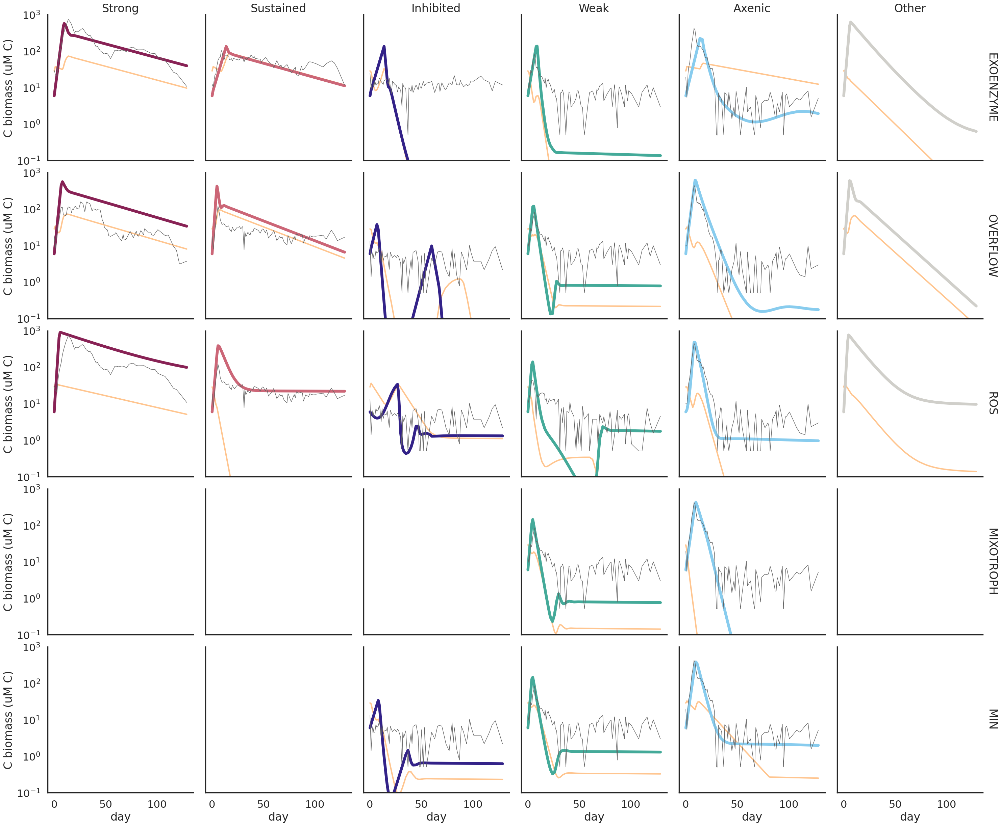

In [332]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[C]', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        row='model', row_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        #print(col_val, row_val)
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) &
            sample_df2.model.isin([row_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                color=HCOLOR,
                x='day', y=f'Bhtotal[N]', lw=3,
                legend=False,
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]_clip', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log', ) # ylim=(5e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    g.set(ylim=(1e-1, 1e3))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

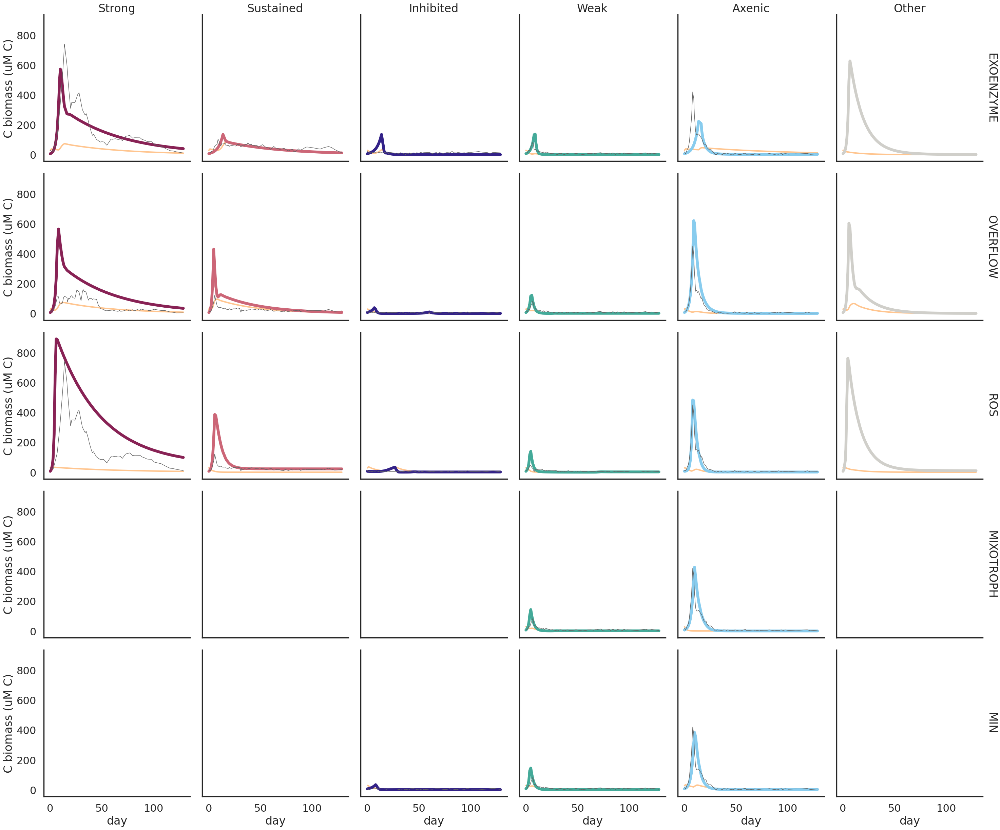

In [333]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[C]', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        row='model', row_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        #print(col_val, row_val)
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) &
            sample_df2.model.isin([row_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                color=HCOLOR,
                x='day', y=f'Bhtotal[N]', lw=3,
                legend=False,
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]_clip', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
    #g.set(yscale='log', ) # ylim=(5e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(1e-1, 1e3))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

In [381]:
sample_df2.columns

Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
       'hash', 'VPRO', 'Unnamed: 0', 'Sample', 'full name', 'Group',
       'RMSE_Bptotal[N]', 'RMSE_Bptotal[C]', 'compare_points', 'RMSE',
       'RMSE_filled', 'VPRO_cluster', 'day', 'Bptotal[N]', 'Bptotal[C]',
       'Bhtotal[N]', 'Bhtotal[C]', 'DON', 'DIN', 'RDON', 'RDOC', 'DOC'],
      dtype='object')

In [585]:
cccorder2 = ['Bptotal[C]', 'Bhtotal[C]', 'DOC',  'RDOC', ]
cccpalette2 = [PCOLOR,HCOLOR,  '#D65F59', '#FF8A83']
cccpalette22 = [PCOLOR_light,HCOLOR_light,  '#D65F59', '#FF8A83']
ccnorder1 = ['Bptotal[N]', 'Bhtotal[N]', 'DIN','DON',  'RDON', ]
#ccnpalette1 = ['#3A5A40', '#D4AF37',  '#262842', '#2C497F', '#8897BD']
#ccnpalette1 = ['#3A5A40', '#D4AF37',  '#4651a9', '#749BC2', '#91C8E4']
ccnpalette1 = [PCOLOR,HCOLOR,  '#4651a9', '#749BC2', '#91C8E4']
ccnpalette12 = [PCOLOR_light,HCOLOR_light,  '#4651a9', '#749BC2', '#91C8E4']


898.3461829525852
684.3060273431144
921.7919764255419
323.30967467752237
947.4615930275448
416.5325683827198
nan
350.1682639811942
nan
326.0857786596713


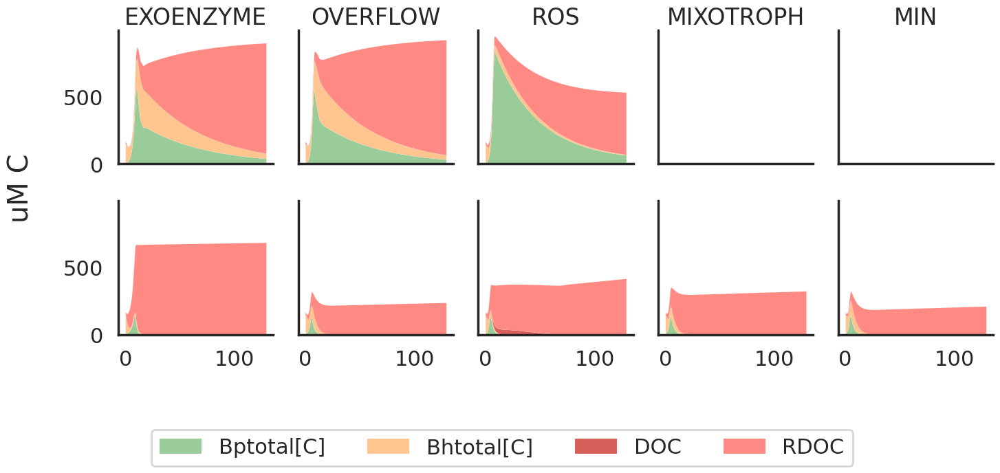

In [586]:
fig, axes = plt.subplots(nrows=2, ncols=len(morder), figsize=(15,6), sharex=True, sharey=True) #, facecolor="#F0F0F0")
for i,m in enumerate(morder):
    for j, y in enumerate(['Strong', 'Weak']):
        d = sample_df2.loc[sample_df2.y_pred.isin([y]) & sample_df2.model.isin([m]) ]
        ax = axes[j,i]
        cols, colors = zip(*[(a,c) for a,c in zip(cccorder2, cccpalette2) if a in d.columns])
        cols = list(cols)
        ax.stackplot(d.day, d[cols].T, labels=cols, colors=colors, lw=0.05)
        if j == 0:
            ax.set_title(f'{m}')
        #ax.set_ylim((0,1300))
        print(d[cols].sum(axis=1).max())

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
legend_dict = dict(zip(labels, lines))
labels1 = cccorder2
lines1 = [legend_dict[c] for c in cccorder2]
#labels1, lines1,  = list(zip(*legend_dict.items()))
#plt.suptitle(model)
#fig.supxlabel('day', y=0.1)
fig.supylabel('uM C')

sns.despine()
plt.tight_layout()

#fig.legend(lines1, labels1, loc='center left', bbox_to_anchor=(1, 0.5))
fig.legend(lines1, labels1, loc='lower center', ncol=5,  bbox_to_anchor=(0.5, -0.2))
#fig.legend(lines1, labels1, loc='center left', bbox_to_anchor=(1, 0.5))


132.46428571428572
132.46428571428572
132.46428571428572
132.4642858074401
132.46428571668488
132.4642857216429
nan
132.46428571428572
nan
132.46428575992638


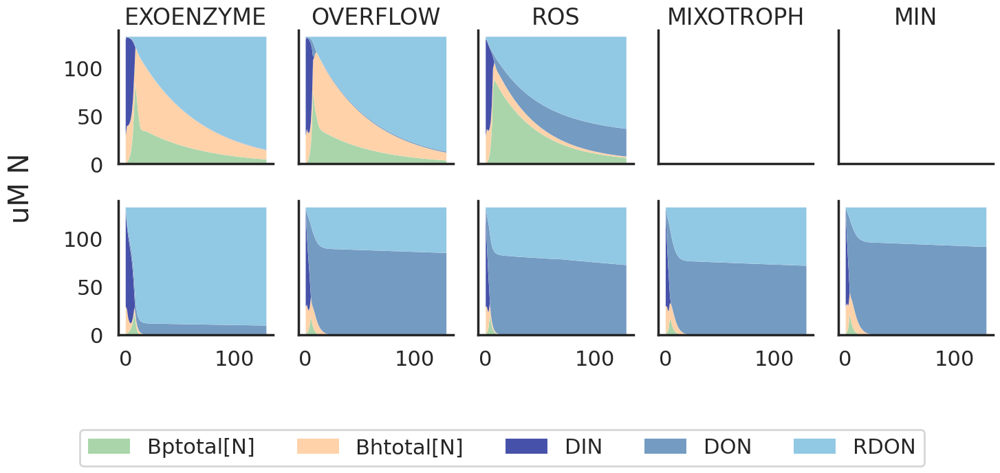

In [587]:
fig, axes = plt.subplots(nrows=2, ncols=len(morder), figsize=(15,6), sharex=True, sharey=True) #, facecolor="#F0F0F0")
for i,m in enumerate(morder):
    for j, y in enumerate(['Strong', 'Weak']):
        d = sample_df2.loc[sample_df2.y_pred.isin([y]) & sample_df2.model.isin([m]) ]
        ax = axes[j,i]
        cols, colors = zip(*[(a,c) for a,c in zip(ccnorder1, ccnpalette12) if a in d.columns])
        cols = list(cols)
        ax.stackplot(d.day, d[cols].T, labels=cols, colors=colors, lw=0.05)
        if j == 0:
            ax.set_title(f'{m}')
        #ax.set_ylim((0,1300))
        print(d[cols].sum(axis=1).max())

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
legend_dict = dict(zip(labels, lines))
labels1 = ccnorder1
lines1 = [legend_dict[c] for c in ccnorder1]
#labels1, lines1,  = list(zip(*legend_dict.items()))
#plt.suptitle(model)
#fig.supxlabel('day', y=0.1)
fig.supylabel('uM N')

sns.despine()
plt.tight_layout()

#fig.legend(lines1, labels1, loc='center left', bbox_to_anchor=(1, 0.5))
fig.legend(lines1, labels1, loc='lower center', ncol=5,  bbox_to_anchor=(0.5, -0.2))
#fig.legend(lines1, labels1, loc='center left', bbox_to_anchor=(1, 0.5))


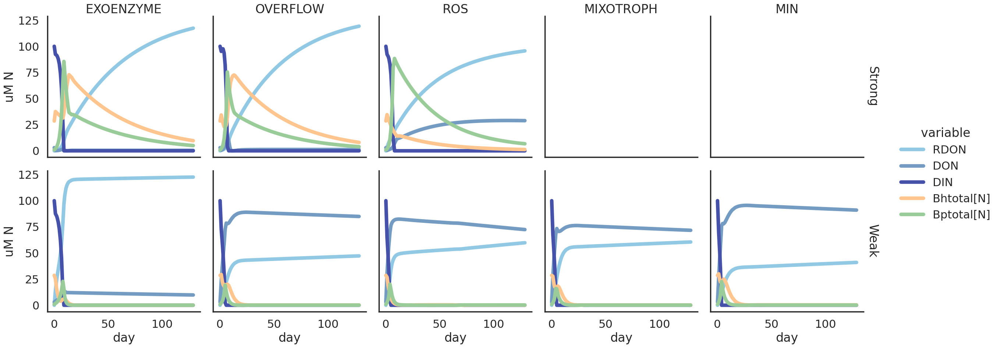

In [592]:
gorder2 =  ['Strong', 'Weak']
msample_df2 = sample_df2.loc[sample_df2.y_pred.isin(gorder2)].melt(
    id_vars=['run_id', 'model', 'y_pred', 'day'],
    value_vars=ccnorder1
)
g = sns.relplot(
    data=msample_df2,
    hue='variable', hue_order=reversed(ccnorder1), palette=reversed(ccnpalette1),
    x='day', y='value', kind='line', lw=7,
    col='model', col_order=morder,
    row='y_pred', row_order=gorder2,
    facet_kws=dict( margin_titles=True),
    
)
g.set(ylabel='uM N')
#g.set(ylabel='')
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

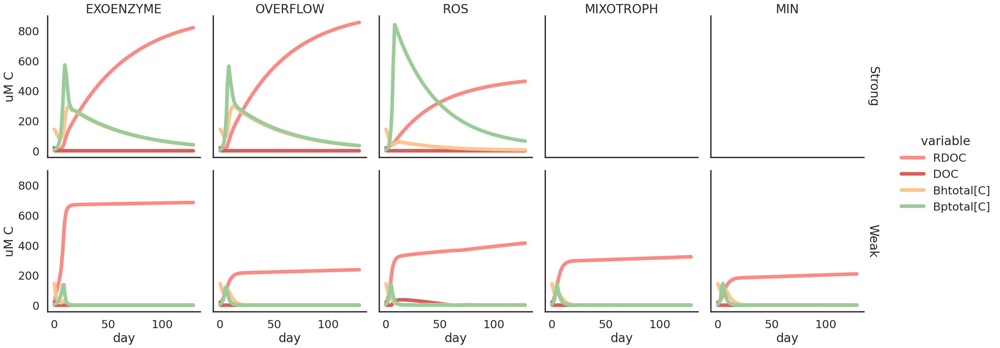

In [593]:
gorder2 =  ['Strong', 'Weak']
msample_df2 = sample_df2.loc[sample_df2.y_pred.isin(gorder2)].melt(
    id_vars=['run_id', 'model', 'y_pred', 'day'],
    value_vars=cccorder2
)
g = sns.relplot(
    data=msample_df2,
    hue='variable', hue_order=reversed(cccorder2), palette=reversed(cccpalette2),
    x='day', y='value', kind='line', lw=7,
    col='model', col_order=morder,
    row='y_pred', row_order=gorder2,
    facet_kws=dict( margin_titles=True),
    
)
g.set(ylabel='uM C')
#g.set(ylabel='')
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

In [594]:
sample_df2[['y_pred', 'model']].value_counts()

y_pred     model    
Axenic     EXOENZYME    74
Strong     EXOENZYME    74
Weak       OVERFLOW     74
           MIXOTROPH    74
           MIN          74
           EXOENZYME    74
Sustained  ROS          74
           OVERFLOW     74
           EXOENZYME    74
Strong     ROS          74
           OVERFLOW     74
Other      ROS          74
Axenic     MIN          74
Other      OVERFLOW     74
           EXOENZYME    74
Inhibited  ROS          74
           OVERFLOW     74
           MIN          74
           EXOENZYME    74
Axenic     ROS          74
           OVERFLOW     74
           MIXOTROPH    74
Weak       ROS          74
Name: count, dtype: int64

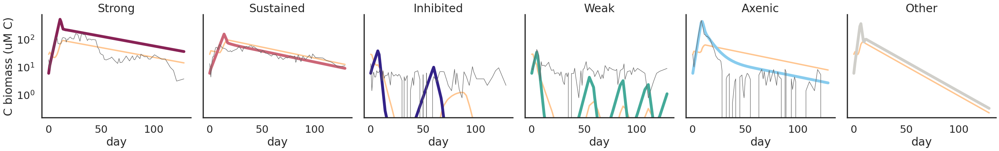

In [250]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[C]_clip', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                color=HCOLOR,
                x='day', y=f'Bhtotal[N]', lw=3,
                legend=False,
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log', ) # ylim=(5e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='C biomass (uM C)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

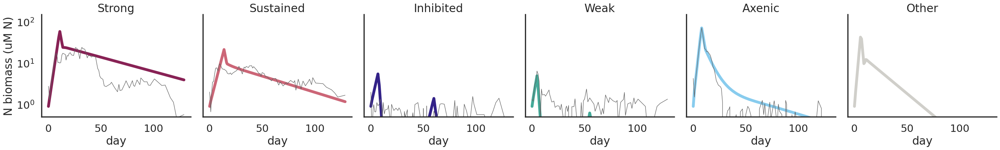

In [251]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[N]', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log',  ylim=(5e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (uM N)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

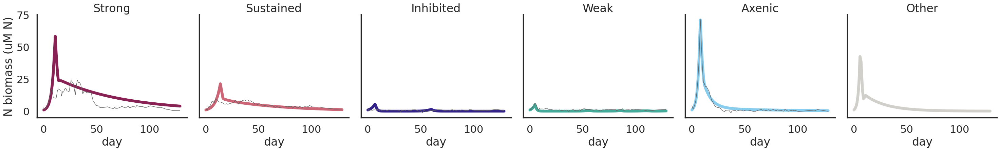

In [44]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[N]', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
#    g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (uM N)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

In [45]:
gpalette

['#882255', '#CC6677', '#332288', '#44AA99', '#88CCEE', '#D0CFCA']

In [46]:
sns.color_palette(sns.color_palette('Greens', n_colors=1) + sns.color_palette('Oranges',n_colors=1))


[(0.45176470588235296, 0.7670895809304115, 0.4612072279892349),
 (0.9914186851211073, 0.550726643598616, 0.23277201076509035)]

In [47]:
ref_meta = refdf.loc[~refdf['train_Group'].isin(['Other'])][['train_Group','full name']].value_counts().reset_index()
ref_meta['train_Group'] = pd.Categorical(ref_meta['train_Group'], categories=gorder)
ref_meta = ref_meta.sort_values(by=['train_Group','full name'])
ref_meta

,train_Group,full name,count
3,Strong,A. macleodii ATCC27126,222
4,Strong,A. macleodii BS11,222
5,Strong,A. macleodii HOT1A3,222
6,Strong,A. mediterranea AltDE,222
7,Strong,A. mediterranea AltDE1,222
8,Strong,Pseudoalteromonas haloplanktis,222
9,Sustained,Ruegeria pomeroyi,222
10,Sustained,Sulfitobacter pseudonitzschiae,222
1,Inhibited,Marinobacter adhaerens HP15,222
2,Inhibited,Phaeobacter gallaeciensis,222


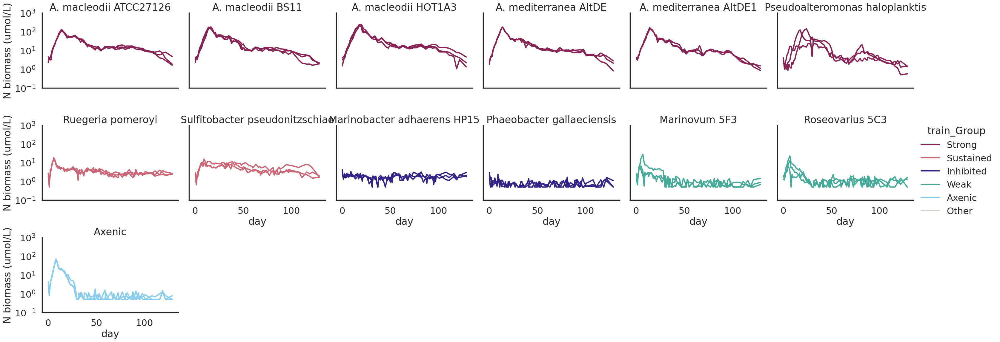

In [48]:
    g = sns.relplot(
        data=refdf.loc[~refdf['train_Group'].isin(['Other'])],
        kind='line', 
        x='day', y='ref_Bp[N]_clip',
        units='Sample', estimator=None, 
        hue='train_Group', palette=gpalette, hue_order=gorder,
        col='full name', col_wrap=6, col_order=ref_meta['full name'],
        #facet_kws=dict( margin_titles=True),
        #legend=False,
        height=4, aspect=1.3,
    )
    g.set(yscale='log', ylim=(1e-1, 1000))
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.show()

In [49]:
minmse_df.columns

Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
       'hash', 'VPRO', 'Unnamed: 0', 'Sample', 'full name', 'Group',
       'RMSE_Bptotal[N]', 'RMSE_Bptotal[C]', 'compare_points', 'RMSE',
       'RMSE_filled'],
      dtype='object')

In [50]:
df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,Unnamed: 0,...,day,Bptotal[N],Bptotal[C],Bhtotal[N],Bhtotal[C],DON,DIN,RDON,RDOC,DOC
0,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,...,0.000000,0.892857,5.915179,28.571429,142.857143,3.000000,100.000000,0.000000,0.000000,19.875000
1,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,...,1.081944,2.810043,18.639915,31.583897,121.876744,0.736171,92.397633,4.936542,21.444833,0.004494
2,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,...,2.164583,7.809131,51.796345,26.169467,101.814747,1.781009,86.927050,9.777628,42.328568,0.011324
3,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,...,2.747222,13.532486,89.747630,25.346352,102.622896,1.576714,79.364403,12.644330,56.371634,0.019207
4,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,...,3.754167,34.961464,231.761703,33.394871,137.981725,0.255829,43.897126,19.954995,95.586353,0.039995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2776253,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26_...,Weak,0.986912,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_999,379199.0,...,110.943750,0.000430,0.003674,0.000313,0.001414,0.077061,0.000973,132.385510,719.490441,0.002339
2776254,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26_...,Weak,0.986912,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_999,379199.0,...,115.845833,0.000421,0.003594,0.000304,0.001377,0.076158,0.000982,132.386421,719.495490,0.002348
2776255,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26_...,Weak,0.986912,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_999,379199.0,...,118.788889,0.000417,0.003565,0.000301,0.001363,0.075622,0.000987,132.386959,719.498471,0.002354
2776256,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26_...,Weak,0.986912,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_999_26,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_999,379199.0,...,121.777778,0.000415,0.003546,0.000299,0.001354,0.075081,0.000990,132.387501,719.501476,0.002360


# BIO GEO chemical

In [705]:
df['total C biomass'] = df['Bptotal[C]'] + df['Bhtotal[C]']
df['HET/PRO C biomass ratio'] = df['Bhtotal[C]'] / df['Bptotal[C]']
df['PRO/HET C biomass ratio'] = df['Bptotal[C]'] / df['Bhtotal[C]']


In [706]:
df['total N biomass'] = df['Bptotal[N]'] + df['Bhtotal[N]']
df['HET/PRO N biomass ratio'] = df['Bhtotal[N]'] / df['Bptotal[N]']
df['PRO/HET N biomass ratio'] = df['Bptotal[N]'] / df['Bhtotal[N]']
df['biomass C/N ratio'] = (df['Bhtotal[C]'] + df['Bptotal[C]']) / (df['Bhtotal[N]'] + df['Bptotal[N]'])


# total PP and total N uptake

In [708]:
sim_df_filtered = sim_df.loc[sim_df.run_id.isin(minmse_df_good.run_id)]

In [709]:
sim_df_filtered

,Unnamed: 0,Bp,Np,Cp,Bh,Nh,Ch,DON,RDON,DIN,...,additionalLossRatep,additionalLossRateh,regNp,regNh,regCp,regCh,deathC_DOCp,deathC_DOCh,deathN_DONp,deathN_DONh
74,74,0.892857,0.000000,0.000000,28.571429,0.000000,0.000000e+00,3.000000,0.000000,100.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75,75,1.052093,0.339123,2.163865,14.775275,4.120241,-2.235984e-18,4.269407,17.574444,90.333702,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
76,76,1.535948,0.498107,3.187719,6.964386,1.860391,9.854417e-02,6.643176,26.335688,88.626589,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
77,77,1.886507,0.610909,3.923495,4.825553,1.224767,1.748450e-01,7.486448,29.187769,87.242333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78,78,2.699925,0.870823,5.641276,2.908540,0.758324,2.982571e-01,8.633670,32.854719,83.738285,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6424305,2776253,0.000386,0.000044,0.001120,0.000272,0.000041,5.401385e-05,0.077061,132.385510,0.000973,...,1.853287e-10,5.077168e-13,0.887121,0.192610,0.241336,0.912889,1.022541e-08,2.544323e-09,1.195677e-09,5.625713e-10
6424306,2776254,0.000377,0.000043,0.001095,0.000265,0.000039,5.277020e-05,0.076158,132.386421,0.000982,...,1.809472e-10,4.957134e-13,0.886578,0.193901,0.242327,0.912228,1.000493e-08,2.478164e-09,1.170709e-09,5.474633e-10
6424307,2776255,0.000374,0.000043,0.001086,0.000262,0.000039,5.234495e-05,0.075622,132.386959,0.000987,...,1.787449e-10,4.896801e-13,0.886254,0.194784,0.242919,0.911776,9.922825e-09,2.452457e-09,1.161585e-09,5.414594e-10
6424308,2776256,0.000372,0.000043,0.001080,0.000260,0.000038,5.210315e-05,0.075081,132.387501,0.000990,...,1.770323e-10,4.849884e-13,0.886025,0.195611,0.243336,0.911351,9.870168e-09,2.436471e-09,1.155759e-09,5.376277e-10


# efficiency 
# Total carbon fixation integrated vs final fixed carbon
# New production N vs recycled production


In [727]:
from scipy import integrate
def _integrate_column(x, collist):
    return pd.Series({colname :  integrate.simpson(x[colname], x=x['t']) for colname in collist})
        

In [729]:
collist = [
    'gross_uptakeINp', 'gross_uptakeINh', 
    'gross_uptakeONp', 'gross_uptakeONh', 
    'gross_uptakeICp', 
]
total_gross_uptake = sim_df_filtered.groupby('run_id').apply(lambda x: _integrate_column(x, collist))

In [731]:
total_gross_uptake = total_gross_uptake.reset_index()

In [733]:
N_uptake_cols = ['gross_uptakeINp', 'gross_uptakeINh', 'gross_uptakeONp', 'gross_uptakeONh']
total_gross_uptake['PP'] = total_gross_uptake['gross_uptakeICp']
total_gross_uptake['Total N uptake'] = total_gross_uptake[N_uptake_cols].sum(axis=1)


In [599]:
df['total fixed C'] = df['total C biomass'] + df['DOC'] + df['RDOC']

In [600]:
last_day_df = df.loc[df.groupby('run_id').day.idxmax()]

In [601]:
max_biomass_C_df = df.loc[df.groupby('run_id')['total C biomass'].idxmax()]

In [602]:
max_biomass_N_df = df.loc[df.groupby('run_id')['total N biomass'].idxmax()]

In [603]:
last_day_df.columns, max_biomass_df.columns

(Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
        'hash', 'VPRO', 'Unnamed: 0', 'Sample', 'full name', 'Group',
        'RMSE_Bptotal[N]', 'RMSE_Bptotal[C]', 'compare_points', 'RMSE',
        'RMSE_filled', 'C2N_Het', 'VPRO_cluster', 'day', 'Bptotal[N]',
        'Bptotal[C]', 'Bhtotal[N]', 'Bhtotal[C]', 'DON', 'DIN', 'RDON', 'RDOC',
        'DOC', 'QCh', 'QCp', 'total C biomass', 'HET/PRO C biomass ratio',
        'PRO/HET C biomass ratio', 'total fixed C', 'total N biomass',
        'HET/PRO N biomass ratio', 'PRO/HET N biomass ratio'],
       dtype='object'),
 Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
        'hash', 'VPRO', 'Unnamed: 0', 'Sample', 'full name', 'Group',
        'RMSE_Bptotal[N]', 'RMSE_Bptotal[C]', 'compare_points', 'RMSE',
        'RMSE_filled', 'VPRO_cluster', 'day', 'Bptotal[N]', 'Bptotal[C]',
        'Bhtotal[N]', 'Bhtotal[C]', 'DON', 'DIN', 'RDON', 'RDOC', 'DOC',
        'total C biomass', 'HET/PRO C

In [604]:
gorder1 = ['Strong', 'Sustained', 'Weak','Inhibited',  ]
gpalette1 = gpalette[:2] + [gpalette[3], gpalette[2], ]
sns.color_palette(gpalette1)

[(0.5333333333333333, 0.13333333333333333, 0.3333333333333333),
 (0.8, 0.4, 0.4666666666666667),
 (0.26666666666666666, 0.6666666666666666, 0.6),
 (0.2, 0.13333333333333333, 0.5333333333333333)]

In [606]:
id_keys = ['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
        'hash', 'VPRO', ]
comb_df = pd.merge(
    last_day_df[id_keys + ['total fixed C',]], 
    max_biomass_C_df[id_keys + ['HET/PRO C biomass ratio','PRO/HET C biomass ratio','total C biomass', 'Bptotal[C]','Bhtotal[C]',]], 
    on=id_keys,
    
)
comb_df = pd.merge(
    comb_df, 
    max_biomass_N_df[id_keys + ['HET/PRO N biomass ratio','PRO/HET N biomass ratio','total N biomass', 'Bptotal[N]','Bhtotal[N]',]], 
    on=id_keys,
    
)



In [735]:
comb_df = pd.merge(
    comb_df, 
    total_gross_uptake[['run_id', 'PP', 'Total N uptake']], 
    on='run_id',
    
)


In [753]:
comb_df['PP / total fixed C'] = comb_df['PP'] / comb_df['total fixed C'] 
comb_df['N reuse'] = comb_df['Total N uptake'] / (INIT_DIN + INIT_DON)



In [736]:
comb_df = comb_df.loc[comb_df.run_id.isin(minmse_df_good.run_id)].reset_index().copy()

In [737]:
comb_df

,level_0,index,run_id,y_pred,max_prob,idx,media,which,model,hash,...,total C biomass,Bptotal[C],Bhtotal[C],HET/PRO N biomass ratio,PRO/HET N biomass ratio,total N biomass,Bptotal[N],Bhtotal[N],PP,Total N uptake
0,0,0,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,...,683.366219,399.217701,284.148518,1.380904,0.724163,115.421728,48.478110,66.943618,3392.013607,662.232153
1,1,4,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,...,453.551862,121.688647,331.863215,5.611282,0.178212,85.680445,12.959732,72.720713,1781.846569,345.028087
2,2,5,monte_EXOENZYME_100_monte_vpro_17_89_EXOENZYME...,Weak,0.989989,monte_EXOENZYME_100_monte_vpro_17_89_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,...,331.578270,287.732387,43.845883,0.204634,4.886765,61.268167,50.860384,10.407783,1103.207868,142.834683
3,3,7,monte_EXOENZYME_100_monte_vpro_17_89_EXOENZYME...,Weak,0.989961,monte_EXOENZYME_100_monte_vpro_17_89_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,...,335.745690,287.819659,47.926031,0.217651,4.594503,63.034253,51.767076,11.267177,1130.139933,358.880230
4,4,8,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,Sustained,0.377493,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,...,528.739844,209.999367,318.740477,3.260579,0.306694,102.779676,24.123408,78.656269,2715.276632,617.857035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37262,37262,86806,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_934_0_l...,Strong,0.980342,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_934_0,lowN,all,ROS,h-8660846992299669535,...,899.544229,810.202603,89.341626,0.251015,3.983832,110.738726,88.519134,22.219593,4606.200603,256.636347
37263,37263,86809,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_936_8_l...,Weak,0.844451,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_936_8,lowN,all,ROS,h-8660846992299669535,...,179.967973,113.278125,66.689848,0.939624,1.064255,31.688796,16.337595,15.351200,591.120244,187.966252
37264,37264,86811,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_979_4_l...,Weak,0.407143,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_979_4,lowN,all,ROS,h-8660846992299669535,...,493.514720,437.922746,55.591974,0.161398,6.195871,61.551809,52.998042,8.553768,1373.751552,349.485154
37265,37265,86812,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_980_59_...,Strong,0.978074,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_980_59,lowN,all,ROS,h-8660846992299669535,...,889.770836,805.185094,84.585742,0.273409,3.657518,114.390668,89.830232,24.560437,3861.069016,296.576033


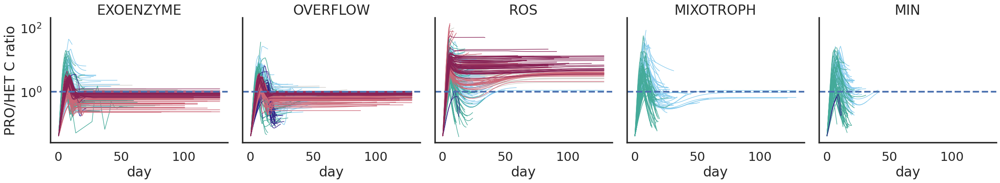

In [679]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids) & df['Bptotal[C]'].ge(5)& df['Bhtotal[C]'].ge(5)],
    x='day',
    y='PRO/HET C biomass ratio',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=1,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='PRO/HET C ratio')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
#g.set(ylim=(0, 11))
for col_val, ax in g.axes_dict.items():
    ax.axhline(1,lw=3, ls='--')

g.set(yscale='log', )
plt.show()

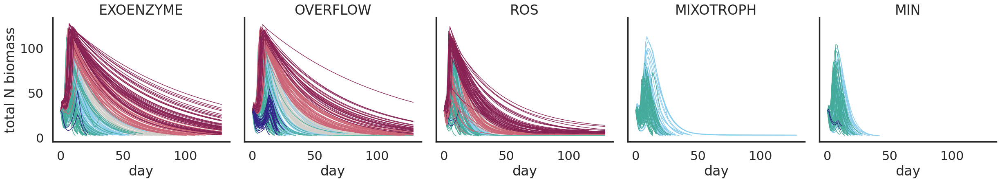

In [743]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids) & df['Bptotal[C]'].ge(5)& df['Bhtotal[C]'].ge(5)],
    x='day',
    y='total N biomass',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=1,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}')#.set(ylabel='', )
#g.set(ylabel='PRO/HET C ratio')

plt.show()

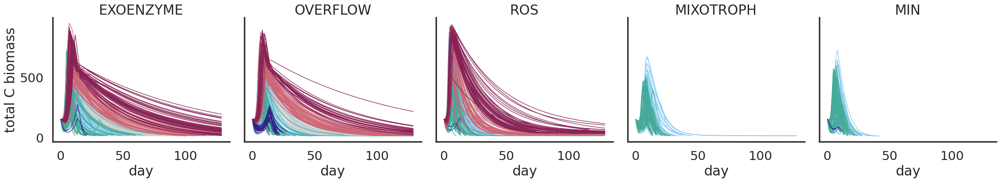

In [742]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids) & df['Bptotal[C]'].ge(5)& df['Bhtotal[C]'].ge(5)],
    x='day',
    y='total C biomass',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=1,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}')# .set(ylabel='', )
#g.set(ylabel='PRO/HET C ratio')

plt.show()

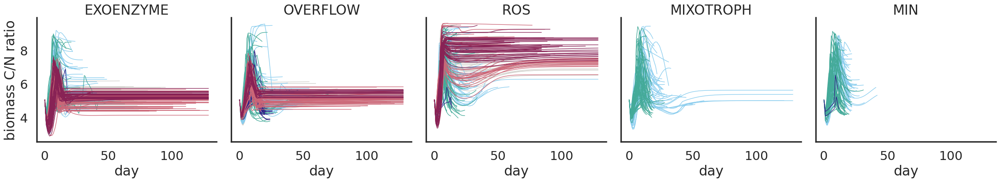

In [681]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids) & df['Bptotal[C]'].ge(5)& df['Bhtotal[C]'].ge(5)],
    x='day',
    y='biomass C/N ratio',
    hue='y_pred', hue_order=reversed(gorder),
    kind='line', lw=1,
    estimator=None, units='run_id', palette=reversed(gpalette),
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='biomass C/N ratio')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)
#g.set(ylim=(0, 11))
#for col_val, ax in g.axes_dict.items():
#    ax.axhline(1,lw=3, ls='--')

#g.set(yscale='log', )
plt.show()

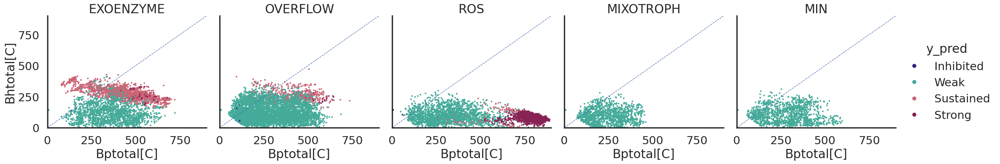

In [611]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    x='Bptotal[C]', y='Bhtotal[C]',
    col='model', col_order=morder,
    s=10, lw=0,
    
)

for col_val, ax in g.axes_dict.items():
    ax.axline((0,0), (850,850),lw=1, ls='--')
g.set(ylim=(0,900),xlim=(0,900), )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

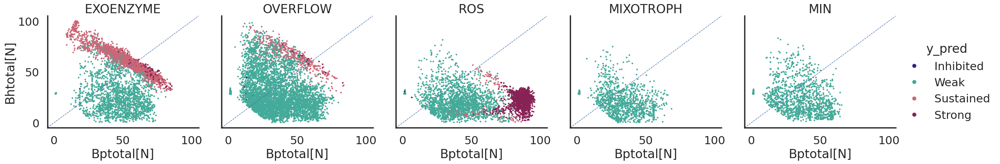

In [617]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    x='Bptotal[N]', y='Bhtotal[N]',
    col='model', col_order=morder,
    s=10, lw=0,
    
)

for col_val, ax in g.axes_dict.items():
    ax.axline((0,0), (100,100),lw=1, ls='--')
#g.set(ylim=(0,900),xlim=(0,900), )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

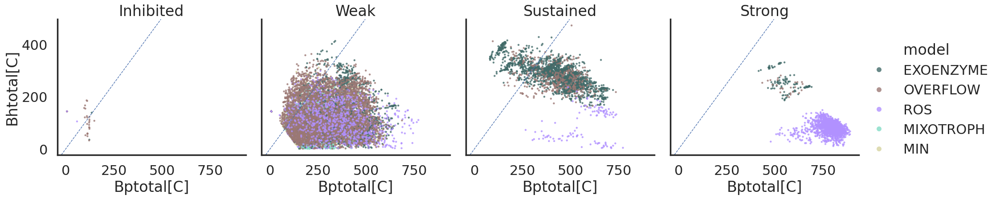

In [669]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other', ])],    
    col='y_pred', col_order=reversed(gorder1), #palette=reversed(gpalette1),
    x='Bptotal[C]', y='Bhtotal[C]',
    hue='model', hue_order=morder, palette=mpalette,
    s=10, lw=0, alpha=0.8,
    
)

for col_val, ax in g.axes_dict.items():
    ax.axline((0,0), (100,100),lw=1, ls='--')
#g.set(ylim=(0,900),xlim=(0,900), )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

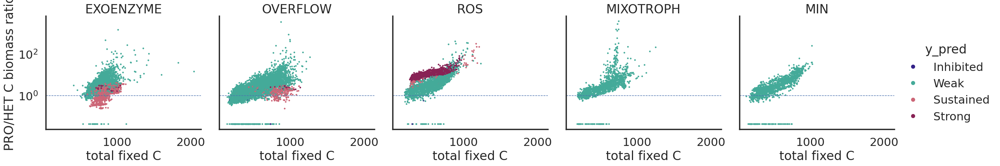

In [612]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    x='total fixed C', y='PRO/HET C biomass ratio',
    col='model', col_order=morder,
    s=10, lw=0,
    
)
for col_val, ax in g.axes_dict.items():
    ax.axhline(1,lw=1, ls='--')

#g.set(ylim=(0,850),xlim=(0,850), )
g.set(yscale='log', #ylim=(5e-3, 40)
     )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

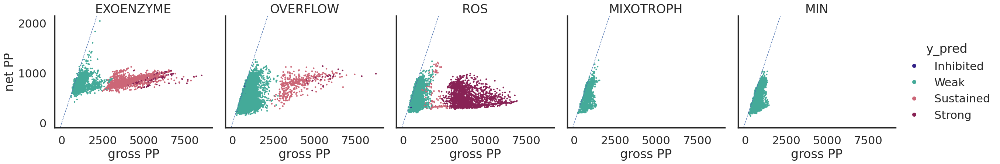

In [757]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    y='total fixed C', x='PP',
    col='model', col_order=morder,
    s=10, lw=0,
    
)
for col_val, ax in g.axes_dict.items():
    ax.axline((0,0), (2000,2000),lw=1, ls='--')

# #g.set(ylim=(0,850),xlim=(0,850), )
# g.set(yscale='log', #ylim=(5e-3, 40)
#      )
g.set(ylabel='net PP', xlabel='gross PP')
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

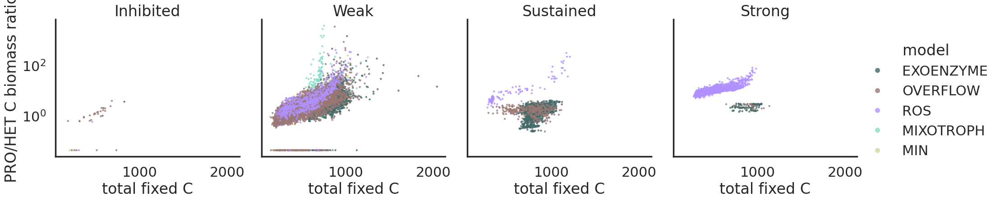

In [673]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other', ])],    
    col='y_pred', col_order=reversed(gorder1), #palette=reversed(gpalette1),
    x='total fixed C', y='PRO/HET C biomass ratio',
    hue='model', hue_order=morder, palette=mpalette,
    s=10, lw=0, alpha=0.8,
    
)
g.set(yscale='log') #ylim=(5e-3, 40)

# for col_val, ax in g.axes_dict.items():
#     ax.axline((0,0), (100,100),lw=1, ls='--')
#g.set(ylim=(0,900),xlim=(0,900), )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

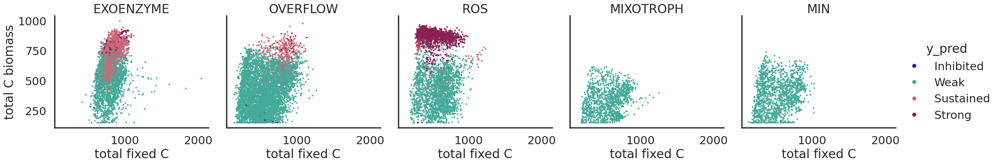

In [632]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    x='total fixed C', y='total C biomass',
    col='model', col_order=morder,
    s=10, lw=0,
    
)
#for col_val, ax in g.axes_dict.items():
#    ax.axhline(1,lw=1, ls='--')

#g.set(ylim=(0,850),xlim=(0,850), )
#g.set(yscale='log', #ylim=(5e-3, 40)
#     )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

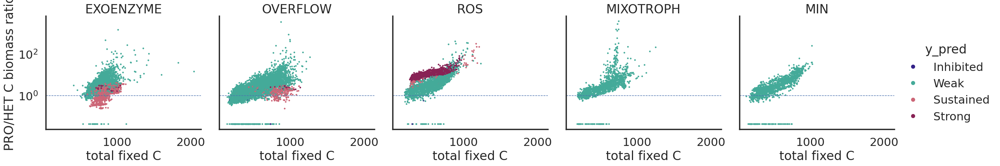

In [629]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    x='total fixed C', y='PRO/HET C biomass ratio',
    col='model', col_order=morder,
    s=10, lw=0,
    
)
for col_val, ax in g.axes_dict.items():
    ax.axhline(1,lw=1, ls='--')

#g.set(ylim=(0,850),xlim=(0,850), )
g.set(yscale='log', #ylim=(5e-3, 40)
     )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

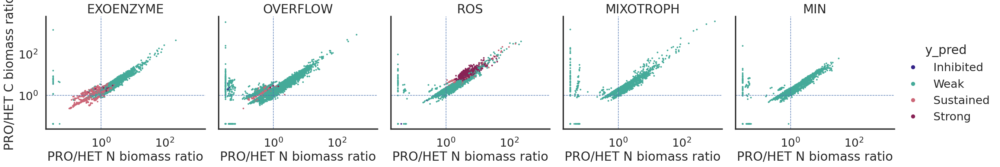

In [619]:
plt.rcParams["legend.markerscale"] = 2.5
g = sns.relplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],    
    hue='y_pred', hue_order=reversed(gorder1), palette=reversed(gpalette1),
    y='PRO/HET C biomass ratio',
    x='PRO/HET N biomass ratio',
    col='model', col_order=morder,
    s=10, lw=0,
    
)
for col_val, ax in g.axes_dict.items():
    ax.axhline(1,lw=1, ls='--')
    ax.axvline(1,lw=1, ls='--')

#g.set(ylim=(0,850),xlim=(0,850), )
g.set(yscale='log', xscale='log', #ylim=(5e-3, 40)
     )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
plt.show()

In [613]:
comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other']), 'HET/PRO C biomass ratio'].describe()

count    18178.000000
mean         0.866372
std          3.007445
min          0.000266
25%          0.164003
50%          0.394660
75%          0.664382
max         24.150943
Name: HET/PRO C biomass ratio, dtype: float64

In [303]:
mmax_biomass_df = max_biomass_df.melt(
    id_vars=['run_id', 'model', 'y_pred'],
    value_vars=['Bptotal[C]', 'Bhtotal[C]']
)

In [304]:
gorder

['Strong', 'Sustained', 'Inhibited', 'Weak', 'Axenic', 'Other']

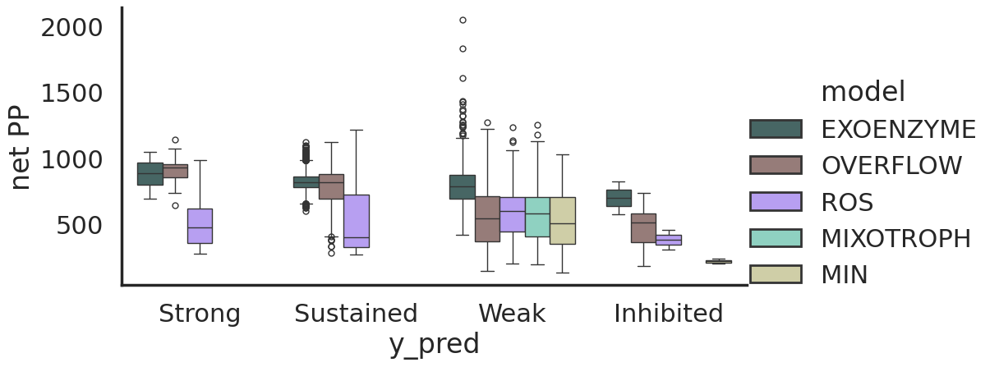

In [758]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total fixed C', 
    hue='model', hue_order=morder, palette=mpalette,
    x='y_pred', order=gorder1, #dodge=False,
    #col='model', col_order=morder,
    kind='box', aspect=2,
)
g.set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(ylabel='net PP')
plt.show()

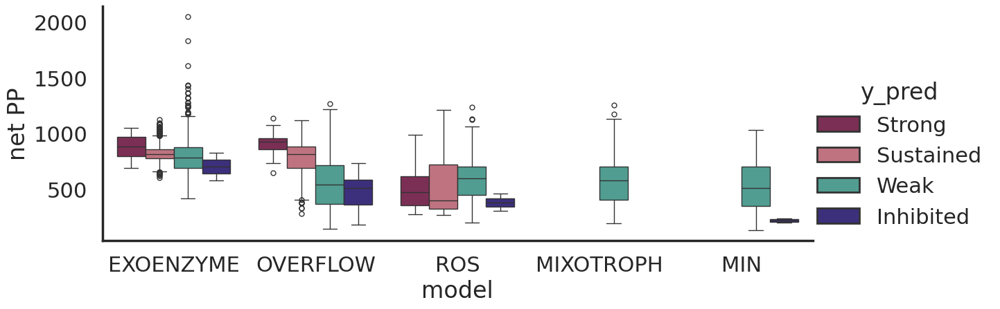

In [759]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total fixed C', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
#g.set(ylim=(0,1300))
g.set(ylabel='net PP')

plt.show()

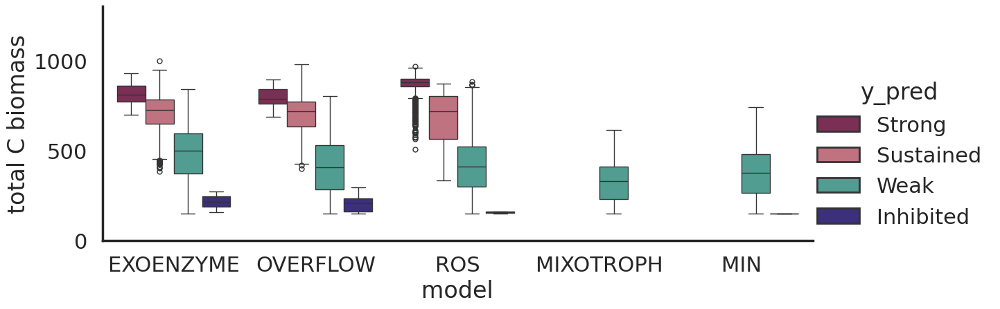

In [638]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total C biomass', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
#plt.axhline
g.set(ylim=(0,1300))

plt.show()

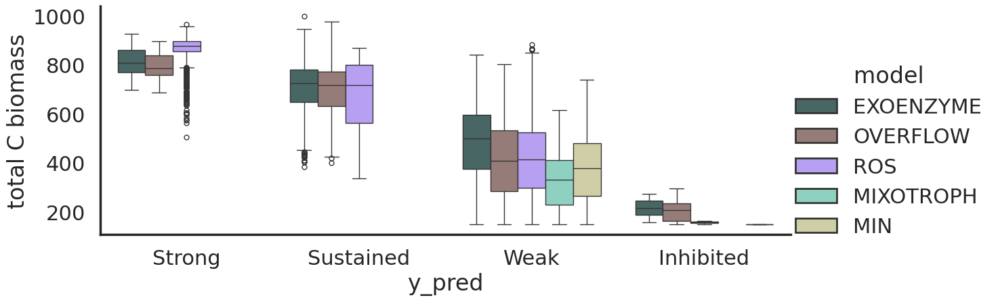

In [659]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total C biomass', 
    x='y_pred', order=gorder1, palette=mpalette,
    hue='model', hue_order=morder,
    kind='box',
    aspect=2.5,
)
plt.axhline
#g.set(ylim=(0,1300))

plt.show()

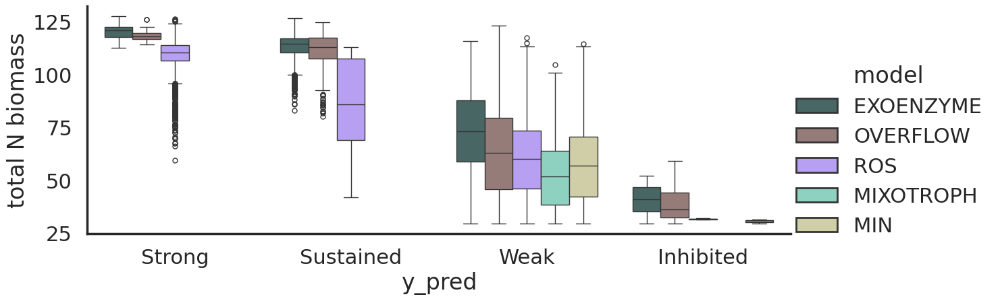

In [658]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total N biomass', 
    x='y_pred', order=gorder1, palette=mpalette,
    hue='model', hue_order=morder,
    kind='box',
    aspect=2.5,
)
plt.axhline
#g.set(ylim=(0,1300))

plt.show()

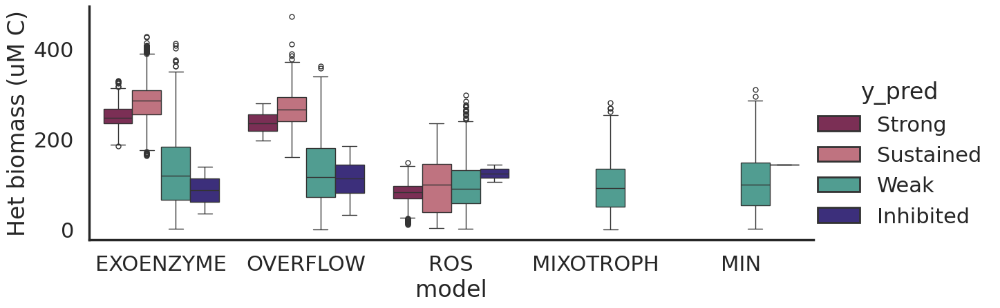

In [622]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='Bhtotal[C]', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
g.set(ylabel='Het biomass (uM C)')

plt.show()

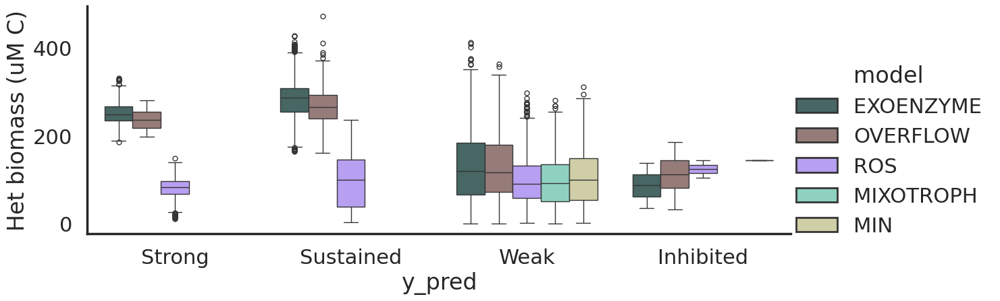

In [667]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='Bhtotal[C]', 
    x='y_pred', order=gorder1, palette=mpalette,
    hue='model', hue_order=morder,
    kind='box',
    aspect=2.5,
)
g.set(ylabel='Het biomass (uM C)')

plt.show()

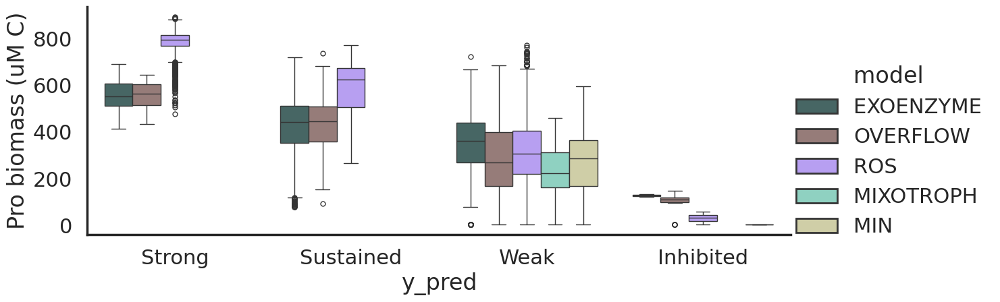

In [668]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='Bptotal[C]', 
    x='y_pred', order=gorder1, palette=mpalette,
    hue='model', hue_order=morder,
    kind='box',
    aspect=2.5,
)
g.set(ylabel='Pro biomass (uM C)')

plt.show()

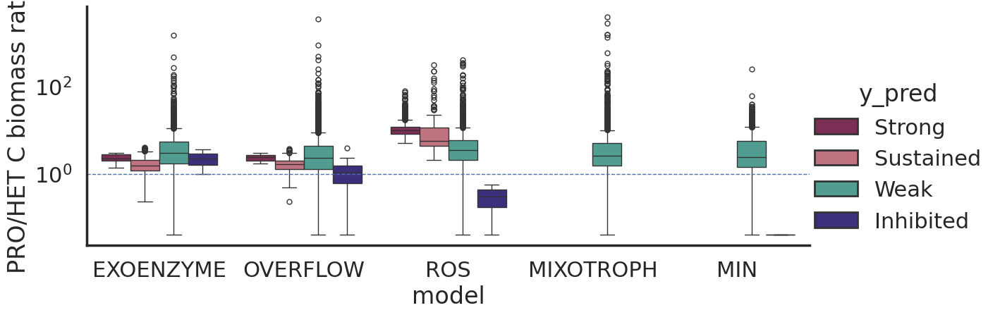

In [626]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='PRO/HET C biomass ratio', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
g.set(#ylim=(5e-2,20),
      yscale='log')
plt.axhline(1,lw=1, ls='--')

plt.show()

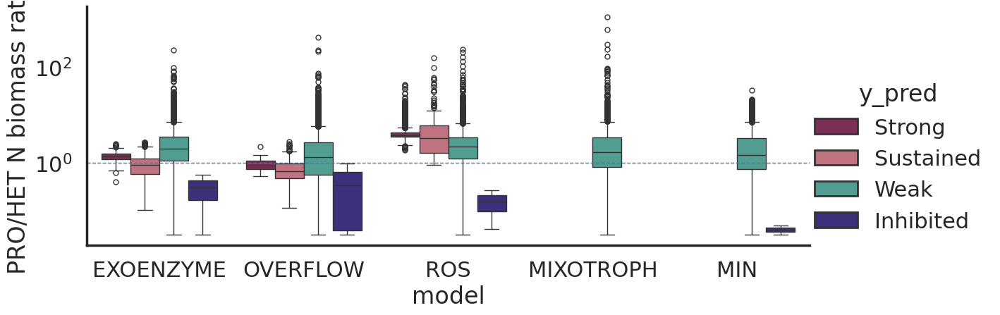

In [627]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='PRO/HET N biomass ratio', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
g.set(#ylim=(5e-2,20),
      yscale='log')
plt.axhline(1,lw=1, ls='--')

plt.show()

In [437]:
comb_df.columns

Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
       'hash', 'VPRO', 'total fixed C', 'HET/PRO C biomass ratio',
       'PRO/HET C biomass ratio', 'total C biomass', 'Bptotal[C]',
       'Bhtotal[C]'],
      dtype='object')

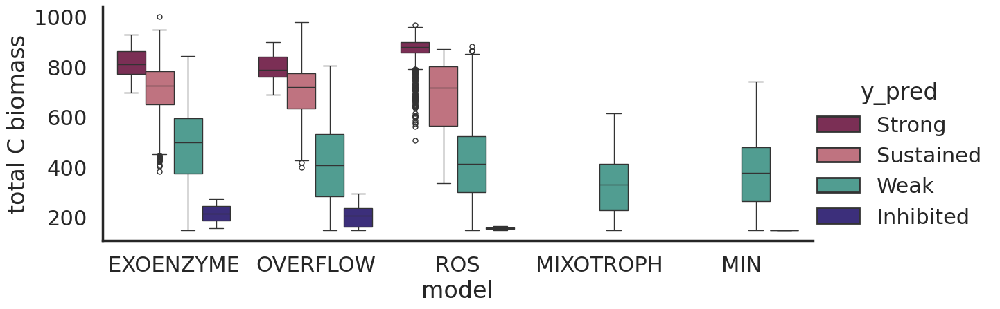

In [628]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total C biomass', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
#g.set(#ylim=(5e-2,20),
#      yscale='log')
#plt.axhline(1,lw=1, ls='--')

plt.show()

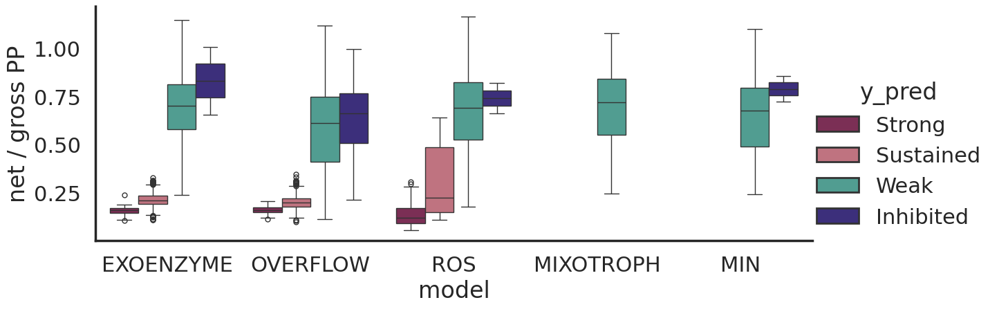

In [761]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='total fixed C / PP', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
#g.set(#ylim=(5e-2,20),
#      yscale='log')
#plt.axhline(1,lw=1, ls='--')
g.set(ylabel='net / gross PP')

plt.show()

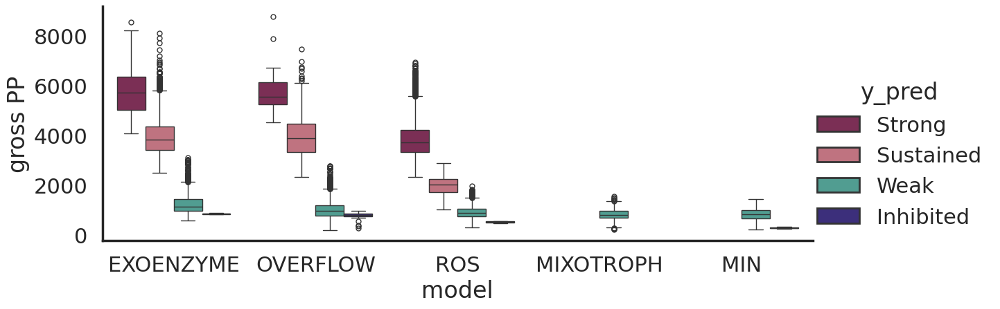

In [760]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='PP', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
#g.set(#ylim=(5e-2,20),
#      yscale='log')
#plt.axhline(1,lw=1, ls='--')
g.set(ylabel='gross PP')

plt.show()

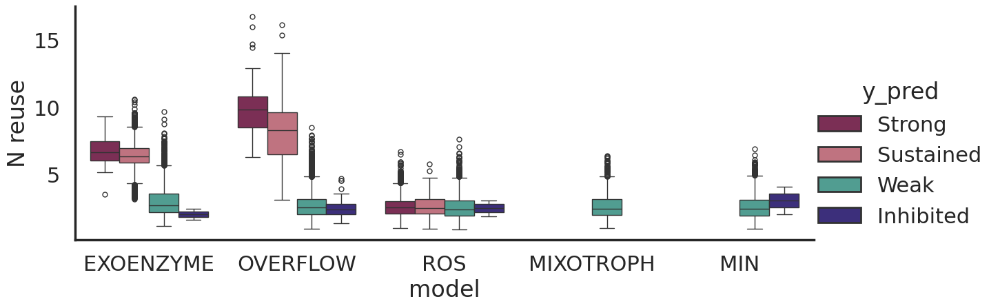

In [752]:
g = sns.catplot(
    data=comb_df.loc[~comb_df.y_pred.isin(['Axenic', 'Other'])],
     y='N reuse', 
    hue='y_pred', hue_order=gorder1, palette=gpalette1,
    x='model', order=morder,
    kind='box',
    aspect=2.5,
)
#g.set(#ylim=(5e-2,20),
#      yscale='log')
#plt.axhline(1,lw=1, ls='--')

plt.show()

In [ ]:
comb_df['total fixed C / PP'] = comb_df['total fixed C'] / comb_df['PP']
comb_df['N reuse'] = comb_df['Total N uptake'] / (INIT_DIN + INIT_DON)



# datashader

In [118]:
plot_width  = int(200)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)
background = "black"
#background=None

from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9

export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

In [119]:
%%time
cvs = ds.Canvas(plot_width, plot_height, )
agg = cvs.points(max_biomass_df, 'Bptotal[C]', 'Bhtotal[C]')

CPU times: user 2.73 ms, sys: 0 ns, total: 2.73 ms
Wall time: 2.42 ms


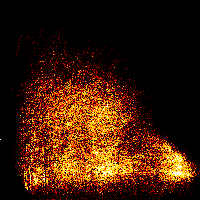

In [120]:
from colorcet import fire
export(tf.shade(agg, cmap = cm(fire, 0.1), how='eq_hist'),"census_ds_fire_eq_hist")

In [121]:
y_pred_color_key = dict(zip(gorder, gpalette))
y_pred_color_key

{'Strong': '#882255',
 'Sustained': '#CC6677',
 'Inhibited': '#332288',
 'Weak': '#44AA99',
 'Axenic': '#88CCEE',
 'Other': '#D0CFCA'}

In [122]:
max_biomass_df['y_pred'] = max_biomass_df['y_pred'].astype("category")

In [123]:
def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(max_biomass_df, 'Bptotal[C]', 'Bhtotal[C]', ds.count_cat('y_pred'))
    img = tf.shade(agg, color_key=y_pred_color_key, how='eq_hist')
    return img

CPU times: user 31.2 ms, sys: 0 ns, total: 31.2 ms
Wall time: 30.6 ms


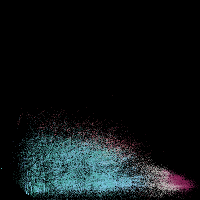

In [124]:
%%time
export(create_image((0,900), (0,900)),"Zoom 0 - USA")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
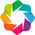

In [103]:
import holoviews as hv
from holoviews.element import tiles
from holoviews.operation.datashader import datashade, dynspread, rasterize
from holoviews import opts
hv.extension('bokeh')

opts.defaults(opts.Overlay(width=700, height=700))

In [104]:
color_points = hv.NdOverlay({k: hv.Points([-80,40]).opts(color=v, size=0) for k, v in y_pred_color_key.items()})
color_points.opts(clone=True, xaxis=None, yaxis=None, height=190, width=145)

:NdOverlay   [Element]
   :Points   [x,y]

In [168]:
max_biomass_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,Unnamed: 0,...,Bhtotal[C],DON,DIN,RDON,RDOC,DOC,total C biomass,total fixed C,PRO/HET C biomass ratio,HET/PRO C biomass ratio
5,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989477,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_20,710504.0,...,243.008454,0.006770,1.506140e-05,32.653979,172.103587,0.047283,670.596316,842.747186,1.759560,0.568324
80,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Weak,0.989400,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_22,717797.0,...,117.660443,3.113350,2.751757e-03,43.038760,300.221869,0.031288,540.391986,840.645143,3.592809,0.278334
155,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Other,0.528581,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_54,NaN,...,295.483004,0.009839,4.840402e-05,28.735396,189.488366,0.050916,653.717187,843.256469,1.212368,0.824832
230,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,Axenic,0.624934,monteadd2_EXOENZYME_13_monte_vpro_11_62_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1_94,701930.0,...,82.129425,6.283812,2.389576e-03,56.986009,293.813448,0.026376,527.429674,821.269497,5.421933,0.184436
310,monteadd2_EXOENZYME_13_monte_vpro_13_69_EXOENZ...,Axenic,0.968536,monteadd2_EXOENZYME_13_monte_vpro_13_69_EXOENZ...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1_28,711639.0,...,74.435706,2.997243,1.265072e+01,72.613368,369.518186,0.060553,208.953141,578.531880,1.807163,0.553354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2775899,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_962_93_...,Inhibited,0.620482,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_962_93,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_962,577132.0,...,98.928134,32.805420,1.044761e-01,44.586435,281.450839,0.017618,308.836722,590.305179,2.121829,0.471292
2775968,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_979_4_l...,Weak,0.407143,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_979_4,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_979,337118.0,...,55.591974,40.191185,3.039589e-06,33.686472,149.339190,0.017551,493.514720,642.871461,7.877446,0.126945
2776042,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_980_59_...,Strong,0.978074,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_980_59,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_980,630541.0,...,84.585742,17.017707,6.208715e-07,8.069572,44.313610,0.024098,889.770836,934.108544,9.519159,0.105051
2776116,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_994_14_...,Axenic,0.685280,monteadd_ROS_9_monte_vpro_19_33_ROS_C0_994_14,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0_994,599984.0,...,66.276680,2.898438,1.260602e-07,23.203645,148.254219,0.000536,720.920519,869.175275,9.877439,0.101241


In [175]:
dataset = hv.Dataset(max_biomass_df, kdims=['Bptotal[C]', 'Bhtotal[C]','y_pred', 'model'], vdims=['y_pred'])
#points = hv.Points(dataset, kdims=['Bptotal[C]', 'Bhtotal[C]'])
#hvmap = hv.HoloMap()
#shaded = datashade(points, color_key=y_pred_color_key, min_alpha=100, aggregator=ds.count_cat('y_pred'), cnorm='eq_hist')
#race   = dynspread(shaded, threshold=0.8).opts(bgcolor='black', width=900, height=500)
#shaded.opts(bgcolor='black', width=900, height=500)
grouped = dataset.select(model=morder).select(y_pred=gorder).to(hv.Points, ['Bptotal[C]', 'Bhtotal[C]'])
#gridspace = grouped.grid('y_pred')
#gridspace.opts(
#    opts.Curve(width=200, color='indianred'))
#grouped.grid('model')
#gridspace
grouped

/home/oweissberg/work/tools/anaconda3/lib/python3.11/site-packages/panel/io/embed.py:84: FutureWarning: '_param_watchers' has been deprecated and will be removed in a future version. Use `inst.param.watchers` instead.
  return [w for pwatchers in reactive._param_watchers.values()


:HoloMap   [model]
   :Points   [Bptotal[C],Bhtotal[C]]   (y_pred)

In [176]:
print(grouped)

:HoloMap   [model]
   :Points   [Bptotal[C],Bhtotal[C]]   (y_pred)


In [117]:
points = hv.Points(hv.Dataset(max_biomass_df, kdims=['Bptotal[C]', 'Bhtotal[C]',], vdims=['y_pred']))
shaded = datashade(points, color_key=y_pred_color_key, min_alpha=100, aggregator=ds.count_cat('y_pred'), cnorm='eq_hist')
#race   = dynspread(shaded, threshold=0.8).opts(bgcolor='black', width=900, height=500)
shaded.opts(bgcolor='black', width=500, height=250)


:DynamicMap   []
   :RGB   [Bptotal[C],Bhtotal[C]]   (R,G,B,A)

In [125]:
print(shaded)

:DynamicMap   []
   :RGB   [Bptotal[C],Bhtotal[C]]   (R,G,B,A)


In [112]:
population = dynspread(rasterize(points)).opts(cnorm='eq_hist', cmap="fire", colorbar=True, tools=['hover'])
population

:DynamicMap   []
   :Image   [Bptotal[C],Bhtotal[C]]   (Bptotal[C]_Bhtotal[C] Count)

In [441]:
sim_df.columns

Index(['Unnamed: 0', 'Bp', 'Np', 'Cp', 'Bh', 'Nh', 'Ch', 'DON', 'RDON', 'DIN',
       'DOC', 'RDOC', 'DIC', 'ROS', 't', 'day', 'gross_uptakeINp',
       'gross_uptakeINh', 'gross_uptakeONp', 'gross_uptakeONh',
       'gross_uptakeICp', 'gross_uptakeICh', 'gross_uptakeOCp',
       'gross_uptakeOCh', 'uptakeNp', 'uptakeNh', 'uptakeCp', 'uptakeCh',
       'QCp', 'QCh', 'biosynthesisNp', 'biosynthesisNh', 'respirationCp',
       'respirationCh', 'biomass_breakdownCp', 'biomass_breakdownCh',
       'overflowNp', 'overflowNh', 'overflowCp', 'overflowCh', 'Bp[C]',
       'Bptotal[N]', 'Bptotal[C]', 'Bh[C]', 'Bhtotal[N]', 'Bhtotal[C]',
       'run_id', 'ROSproductionp', 'ROSproductionh', 'ROSlossp', 'ROSlossh',
       'deathbiomassNp', 'deathbiomassNh', 'deathstoreNp', 'deathstoreNh',
       'deathstoreCp', 'deathstoreCh', 'DON2DIN_exop', 'DON2DIN_exoh',
       'DON2DIN', 'additionalLossRatep', 'additionalLossRateh', 'regNp',
       'regNh', 'regCp', 'regCh', 'deathC_DOCp', 'deathC_DOCh', 'dea